In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# 1. Tiền xử lý dữ liệu

In [2]:
pip install mysql-connector-python

Note: you may need to restart the kernel to use updated packages.


In [3]:
import mysql.connector as mydb
from mysql.connector import errorcode


In [4]:
try:
  cnx = mydb.connect(host = 'localhost', user='root', password = 'root',
                                database='air_quality')
except mysql.connector.Error as err:
  if err.errno == errorcode.ER_ACCESS_DENIED_ERROR:
    print("Something is wrong with your user name or password")
  elif err.errno == errorcode.ER_BAD_DB_ERROR:
    print("Database does not exist")
  else:
    print(err)
else:
  cnx.close()

import mysql.connector 
mydb = mysql.connector.connect(
  host="localhost",
  user="root",
  password="root"
)

mycursor = mydb.cursor()
mycursor.execute("SHOW DATABASES")

for x in mycursor:
  print(x)

('air_quality',)
('country',)
('datnuoc',)
('demo2',)
('education',)
('information_schema',)
('mydatabase',)
('mysql',)
('performance_schema',)
('sakila',)
('sieuthi',)
('sinhvien',)
('sinhvien_demo',)
('sys',)
('thu_vien',)
('thuvien',)
('webdacsan',)
('wine',)
('world',)


In [5]:
conn = mysql.connector.connect(host='localhost', database='air_quality', user='root', password='root')
cursor = conn.cursor()
cursor.execute("SELECT * FROM city_day")
results = cursor.fetchall()
results[0]

('Ahmedabad',
 '2015-01-01',
 '',
 '',
 '0.92',
 '18.22',
 '17.15',
 '',
 '0.92',
 '27.64',
 '133.36',
 '0.0',
 '0.02',
 '0.0',
 '',
 '')

In [6]:
data = pd.DataFrame(results, columns=cursor.column_names)

In [7]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 29532 entries, 0 to 29531
Data columns (total 16 columns):
 #   Column      Non-Null Count  Dtype 
---  ------      --------------  ----- 
 0   City        29532 non-null  object
 1   Date        29532 non-null  object
 2   PM2.5       29532 non-null  object
 3   PM10        29532 non-null  object
 4   NO          29532 non-null  object
 5   NO2         29532 non-null  object
 6   NOx         29532 non-null  object
 7   NH3         29532 non-null  object
 8   CO          29532 non-null  object
 9   SO2         29532 non-null  object
 10  O3          29532 non-null  object
 11  Benzene     29532 non-null  object
 12  Toluene     29532 non-null  object
 13  Xylene      29532 non-null  object
 14  AQI         29532 non-null  object
 15  AQI_Bucket  29532 non-null  object
dtypes: object(16)
memory usage: 3.6+ MB


In [8]:
columns = data.columns
numeric_columns = columns.drop(['City', 'Date', 'AQI_Bucket'])

In [9]:
df = data.replace(to_replace = '', value = pd.NA)
for column in numeric_columns:
    temp = pd.to_numeric(data[column])
    df[column] = temp
df.isna().sum()

City              0
Date              0
PM2.5          4598
PM10          11141
NO             3582
NO2            3585
NOx            4186
NH3           10329
CO             2059
SO2            3854
O3             4022
Benzene        5623
Toluene        8041
Xylene        18110
AQI            4681
AQI_Bucket     4681
dtype: int64

## Tính độ tương quan giữa các thuộc tính

In [10]:
df.corr()

,PM2.5,PM10,NO,NO2,NOx,NH3,CO,SO2,O3,Benzene,Toluene,Xylene,AQI
PM2.5,1.000000,0.846498,0.433480,0.350735,0.436792,0.275086,0.089907,0.132313,0.161311,0.023911,0.117078,0.114579,0.659186
PM10,0.846498,1.000000,0.502349,0.464380,0.527768,0.376816,0.112588,0.256974,0.244919,0.022265,0.169335,0.081700,0.803313
NO,0.433480,0.502349,1.000000,0.478051,0.794890,0.185621,0.212607,0.170323,0.014565,0.035771,0.150857,0.094237,0.452185
NO2,0.350735,0.464380,0.478051,1.000000,0.627627,0.234938,0.356506,0.392207,0.293432,0.025259,0.273918,0.171701,0.537079
NOx,0.436792,0.527768,0.794890,0.627627,1.000000,0.166224,0.226992,0.238397,0.093170,0.039121,0.189386,0.087398,0.486450
NH3,0.275086,0.376816,0.185621,0.234938,0.166224,1.000000,0.104891,-0.038998,0.094972,-0.015650,0.013227,-0.019813,0.252019
CO,0.089907,0.112588,0.212607,0.356506,0.226992,0.104891,1.000000,0.489697,0.041717,0.061861,0.277904,0.154889,0.683339
SO2,0.132313,0.256974,0.170323,0.392207,0.238397,-0.038998,0.489697,1.000000,0.162080,0.036110,0.296138,0.251195,0.490575
O3,0.161311,0.244919,0.014565,0.293432,0.093170,0.094972,0.041717,0.162080,1.000000,0.020250,0.130179,0.111410,0.199023
Benzene,0.023911,0.022265,0.035771,0.025259,0.039121,-0.015650,0.061861,0.036110,0.020250,1.000000,0.739286,0.415427,0.044406


In [11]:
df_clean = df.copy()

In [12]:
df_clean = df_clean.drop('AQI_Bucket', axis = 1)

## Xem khoảng thời gian lấy mẫu

In [13]:
import datetime

In [14]:
df_clean.Date = df_clean.Date.apply(lambda x : datetime.datetime.strptime(x, '%Y-%m-%d'))
city_day = df_clean.sort_values(by = 'Date')

In [15]:
print('Thời gian bắt đầu lấy mẫu: {}, thời gian kết thúc: {}'.format(df_clean.Date.min().strftime('%Y-%m-%d'), df_clean.Date.max().strftime('%Y-%m-%d')))

Thời gian bắt đầu lấy mẫu: 2015-01-01, thời gian kết thúc: 2020-07-01


In [16]:
df_clean.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 29532 entries, 0 to 29531
Data columns (total 15 columns):
 #   Column   Non-Null Count  Dtype         
---  ------   --------------  -----         
 0   City     29532 non-null  object        
 1   Date     29532 non-null  datetime64[ns]
 2   PM2.5    24934 non-null  float64       
 3   PM10     18391 non-null  float64       
 4   NO       25950 non-null  float64       
 5   NO2      25947 non-null  float64       
 6   NOx      25346 non-null  float64       
 7   NH3      19203 non-null  float64       
 8   CO       27473 non-null  float64       
 9   SO2      25678 non-null  float64       
 10  O3       25510 non-null  float64       
 11  Benzene  23909 non-null  float64       
 12  Toluene  21491 non-null  float64       
 13  Xylene   11422 non-null  float64       
 14  AQI      24851 non-null  float64       
dtypes: datetime64[ns](1), float64(13), object(1)
memory usage: 3.4+ MB


In [17]:
columns = df_clean.columns
columns.shape

(15,)

## Tìm các thuộc tính dạng số và dạng văn bản

In [18]:
cat = [col for col in columns if df_clean[col].dtype == 'object']
num = [col for col in columns if (df_clean[col].dtype == 'int') | (df_clean[col].dtype == 'float')]

In [19]:
print(f"categorcial: {len(cat)}, numeric: {len(num)}")

categorcial: 1, numeric: 13


## Điền dữ liệu còn thiếu bằng giá trị xuất hiện nhiều nhất

In [20]:
for column in num:
  mean_value = df_clean[column].mean()
  df_clean[column].fillna(value = mean_value, inplace = True)

In [21]:
df_clean = df_clean.apply(lambda x: x.fillna(x.value_counts().index[0]))
df_clean.head()

,City,Date,PM2.5,PM10,NO,NO2,NOx,NH3,CO,SO2,O3,Benzene,Toluene,Xylene,AQI
0,Ahmedabad,2015-01-01,67.452842,118.127103,0.92,18.22,17.15,23.483476,0.92,27.64,133.36,0.00,0.02,0.00,166.466782
1,Ahmedabad,2015-01-02,67.452842,118.127103,0.97,15.69,16.46,23.483476,0.97,24.55,34.06,3.68,5.50,3.77,166.466782
2,Ahmedabad,2015-01-03,67.452842,118.127103,17.40,19.30,29.70,23.483476,17.40,29.07,30.70,6.80,16.40,2.25,166.466782
3,Ahmedabad,2015-01-04,67.452842,118.127103,1.70,18.48,17.97,23.483476,1.70,18.59,36.08,4.43,10.14,1.00,166.466782
4,Ahmedabad,2015-01-05,67.452842,118.127103,22.10,21.42,37.76,23.483476,22.10,39.33,39.31,7.01,18.89,2.78,166.466782


## Mã hóa thuộc tính dạng chữ

In [22]:
from sklearn import preprocessing

In [23]:
df_clean['City'].unique()

array(['Ahmedabad', 'Aizawl', 'Amaravati', 'Amritsar', 'Bengaluru',
       'Bhopal', 'Brajrajnagar', 'Chandigarh', 'Chennai', 'Coimbatore',
       'Delhi', 'Ernakulam', 'Gurugram', 'Guwahati', 'Hyderabad',
       'Jaipur', 'Jorapokhar', 'Kochi', 'Kolkata', 'Lucknow', 'Mumbai',
       'Patna', 'Shillong', 'Talcher', 'Thiruvananthapuram',
       'Visakhapatnam'], dtype=object)

In [24]:
label_encoder = preprocessing.LabelEncoder()
df_clean['City'] = label_encoder.fit_transform(df_clean['City'])

In [25]:
df_clean.isnull().sum()

City       0
Date       0
PM2.5      0
PM10       0
NO         0
NO2        0
NOx        0
NH3        0
CO         0
SO2        0
O3         0
Benzene    0
Toluene    0
Xylene     0
AQI        0
dtype: int64

## Chuẩn hóa các thuộc tính về khoảng [0, 1]

In [26]:
from sklearn.preprocessing import MinMaxScaler
scaler = MinMaxScaler()

In [27]:
columns_num = columns.drop('Date')

In [28]:
df_clean[columns_num] = scaler.fit_transform(df_clean[columns_num])

In [29]:
df_clean.head()

,City,Date,PM2.5,PM10,NO,NO2,NOx,NH3,CO,SO2,O3,Benzene,Toluene,Xylene,AQI
0,0.0,2015-01-01,0.070965,0.118118,0.002304,0.050276,0.036674,0.06652,0.005233,0.142533,0.517422,0.000000,0.000044,0.000000,0.075377
1,0.0,2015-01-02,0.070965,0.118118,0.002432,0.043291,0.035199,0.06652,0.005517,0.126593,0.132120,0.008087,0.012092,0.022128,0.075377
2,0.0,2015-01-03,0.070965,0.118118,0.044489,0.053258,0.063512,0.06652,0.098970,0.149910,0.119083,0.014944,0.036056,0.013207,0.075377
3,0.0,2015-01-04,0.070965,0.118118,0.004300,0.050994,0.038428,0.06652,0.009670,0.095847,0.139958,0.009736,0.022293,0.005870,0.075377
4,0.0,2015-01-05,0.070965,0.118118,0.056520,0.059111,0.080748,0.06652,0.125704,0.202837,0.152491,0.015406,0.041530,0.016317,0.075377


## Chia dữ liệu làm 2 phần: Huấn luyện và kiểm tra

In [30]:
from sklearn.model_selection import train_test_split

In [31]:
X = df_clean.drop(['AQI', 'Date'], axis = 1)
y = df_clean['AQI']
X.shape

(29532, 13)

In [32]:
X_train, X_test, y_train, y_test = train_test_split(X,y ,random_state=104, test_size=0.2, shuffle=True)

In [33]:
X_train_2, X_valid, y_train_2, y_valid = train_test_split(X_train, y_train, random_state = 42, test_size = 0.1, shuffle = True)


In [34]:
X_train_np = pd.DataFrame(X_train).to_numpy()
X_test_np = pd.DataFrame(X_test).to_numpy()
y_train_np = pd.DataFrame(y_train).to_numpy()
y_test_np = pd.DataFrame(y_test).to_numpy()

In [35]:
X_train_2_np = pd.DataFrame(X_train_2).to_numpy()
X_valid_np = pd.DataFrame(X_valid).to_numpy()
y_train_2_np = pd.DataFrame(y_train_2).to_numpy()
y_valid_np = pd.DataFrame(y_valid).to_numpy()

# 2. Xây dựng mô hình

In [36]:
from sklearn.ensemble import RandomForestRegressor
from sklearn.linear_model import LinearRegression
from sklearn.metrics import r2_score

## Random Forest Regressor

In [89]:
rf = RandomForestRegressor(random_state = 104)
rf.fit(X_train, y_train)

RandomForestRegressor(random_state=104)

In [90]:
prediction = rf.predict(X_test)
rf_r2_score = r2_score(y_test, prediction)

In [91]:
rf_r2_score

0.8553895501924726

# Linear Regression

## Thử nghiệm với sklearn

In [92]:
lr = LinearRegression()
lr.fit(X_train, y_train)

LinearRegression()

In [93]:
prediction = lr.predict(X_test)
lr_r2_score = r2_score(y_test, prediction)

In [94]:
lr_r2_score

0.7833588125584818

## Xây dựng mô hình

In [37]:
def print_result(iteration, cost):
    if (iteration <= 10) or \
        (iteration <= 100 and iteration % 10 == 0) or \
        (iteration <= 1000 and iteration % 100 == 0) or \
        (iteration <= 10000 and iteration % 1000 == 0) or \
        (iteration <= 100000 and iteration % 10000 == 0) or \
            (iteration > 100000 and iteration % 50000 == 0):
        print('iteration: {:10d}\t\tcost: {:1.4e}'.format(iteration, cost))

In [127]:
class LinearRegression:
    def __init__(self, learning_rate=1e-3, max_iters=250):
        self.learning_rate = learning_rate
        self.max_iters = max_iters
        self.weights = None

    def fit(self, X_train, y_train):
        X_train = self._fit_intercept(X_train)
        self.weights = np.random.rand(X_train.shape[1])

        for iter in range(self.max_iters):
            self.weights = self.weights - self.learning_rate * \
                self._grad(X_train, y_train, self.weights)
            cost = self._cost(X_train, y_train, self.weights)
            print_result(iter, cost)

    def predict(self, X_predict):
        """ This method predicts responses for new data.

        This method will be used for end-users to predict responses
        for future data.

        Arguments:
            X_predict: new data

        Returns: a vector of responses            
        """
#         print(f"X shape: {X.shape}; weights shape: {self.weights.shape}")
        X_predict = X_predict.to_numpy()
        X_predict = np.insert(X_predict, 0, 1, axis=1)
#         print(np.dot(X_predict, self.weights) )
        return np.dot(X_predict, self.weights) 
#         return X_predict @ self.weights
    @staticmethod
    def _cost(X_train, y_train, weights):
        """Calculates the cost w.r.t. weights

        This helper method calculates the cost w.r.t. weights

        Arguments:
            X_train: training features
            y_train: training labels.
            weights: weights vector of the model
        
        Returns: scalar value which represents the cost
        """
        dif = (y_train - X_train @ weights)
        return (dif.T @ dif) / X_train.shape[0]

    @staticmethod
    def _fit_intercept(X_train):
        """Add the intercepting term to the training dataset

        This simple helper method adds the intercepting term to the 
        training dataset.

        Arguments:
            X_train: training dataset

        Returns: training dataset with the interceptor
        """
        return np.column_stack((np.ones(X_train.shape[0]), X_train))

    @staticmethod
    def _grad(X_train, y_train, weights):
        """Calculates the gradient of the cost function w.r.t. weight vector

        This methods calculated the gradient of the cost function w.r.t. 
        weight vector.

        Arguments:
            X_train: training features
            y_train: training labels.
            weights: weights vector of the model
        
        Returns: scalar value which represents the cost
        """
        return 2 * (X_train.T @ (X_train @ weights - y_train)) / X_train.shape[0]

In [128]:
X_train_reg = X_train - X_train.min()
# y_train = np.array([5.5, 3.1, 2.0, 6.1, 2.1, 2.2, 0.8, 3.5, 4.0, 5.1])
model = LinearRegression()
model.fit(X_train_reg, y_train)

iteration:          0		cost: 9.7608e-01
iteration:          1		cost: 9.7091e-01
iteration:          2		cost: 9.6576e-01
iteration:          3		cost: 9.6065e-01
iteration:          4		cost: 9.5556e-01
iteration:          5		cost: 9.5050e-01
iteration:          6		cost: 9.4546e-01
iteration:          7		cost: 9.4046e-01
iteration:          8		cost: 9.3548e-01
iteration:          9		cost: 9.3052e-01
iteration:         10		cost: 9.2560e-01
iteration:         20		cost: 8.7777e-01
iteration:         30		cost: 8.3246e-01
iteration:         40		cost: 7.8952e-01
iteration:         50		cost: 7.4885e-01
iteration:         60		cost: 7.1031e-01
iteration:         70		cost: 6.7379e-01
iteration:         80		cost: 6.3919e-01
iteration:         90		cost: 6.0641e-01
iteration:        100		cost: 5.7536e-01
iteration:        200		cost: 3.4176e-01


In [129]:
from sklearn.metrics import r2_score
y_pred = model.predict(X_test)
lr_r2_score = r2_score(y_test, y_pred)

In [130]:
lr_r2_score

-63.07989907027972

## Feedfoward Neural Network

In [46]:
!pip install keras

In [47]:
from keras.models import Sequential
from keras.layers import Dense, Dropout
from keras.utils import np_utils
import keras.initializers as init
from keras.metrics import MeanSquaredError

ModuleNotFoundError: No module named 'tensorflow'

In [142]:
def NeuralNetwork(X_train, Y_train, X_val=None, Y_val=None, epochs=10, nodes=[], lr=0.15):
    hidden_layers = len(nodes) - 1
    weights = InitializeWeights(nodes)

    for epoch in range(1, epochs+1):
        weights = Train(X_train, Y_train, lr, weights)

        print("Epoch {}".format(epoch))
        print("Training R2 score:{}".format(Count_R2(X_train, Y_train, weights)))
        if X_val.any():
            print("Validation R2 score:{}".format(Count_R2(X_val, Y_val, weights)))
            
    return weights

In [143]:
def InitializeWeights(nodes):
    """Initialize weights with random values in [-1, 1] (including bias)"""
    layers, weights = len(nodes), []
    
    for i in range(1, layers):
        w = [[np.random.uniform(-1, 1) for k in range(nodes[i-1] + 1)]
              for j in range(nodes[i])]
        weights.append(np.matrix(w))
    
    return weights

In [144]:
def ForwardPropagation(x, weights, layers):
    activations, layer_input = [x], x
    for j in range(layers):
        activation = Sigmoid(np.dot(layer_input, weights[j].T))
        activations.append(activation)
        layer_input = np.append(1, activation) # Augment with bias
    
    return activations

In [145]:
def BackPropagation(y, activations, weights, layers):
    outputFinal = activations[-1]
    error = np.matrix(y - outputFinal) # Error at output
    
    for j in range(layers, 0, -1):
        currActivation = activations[j]
        
        if(j > 1):
            # Augment previous activation
            prevActivation = np.append(1, activations[j-1])
        else:
            # First hidden layer, prevActivation is input (without bias)
            prevActivation = activations[0]
        
        delta = np.multiply(error, SigmoidDerivative(currActivation))
        weights[j-1] += lr * np.multiply(delta.T, prevActivation)

        w = np.delete(weights[j-1], [0], axis=1) # Remove bias from weights
        error = np.dot(delta, w) # Calculate error for current layer
    
    return weights

In [146]:
def Train(X, Y, lr, weights):
    layers = len(weights)
    for i in range(len(X)):
        x, y = X[i], Y[i]
        x = np.matrix(np.append(1, x)) # Augment feature vector
        
        activations = ForwardPropagation(x, weights, layers)
        weights = BackPropagation(y, activations, weights, layers)

    return weights

In [147]:
def Sigmoid(x):
    return 1 / (1 + np.exp(-x))

def SigmoidDerivative(x):
    return np.multiply(x, 1-x)

In [232]:
def Predict(X, weights):
    predictions = []
    for item in X:
        layers = len(weights)
        item = np.append(1, item) # Augment feature vector
    
    ##_Forward Propagation_##
        activations = ForwardPropagation(item, weights, layers)
        print(f"Activation: {activations}")
        predictions.append(activations)
    return predictions # Return prediction vector

In [233]:
def Count_R2(X, Y, weights):
    predicts = Predict(X, weights)
    predicts = np.array(predicts)
    numerator = 0
    denominator = 0
    y_avg = np.average(Y, axis = 0)
    for i in range (len(X)):
        print(predicts[i])
        numerator += ((predicts[i] - Y[i]) * (predicts[i] - Y[i]))
        denominator += ((predicts[i] - y_avg) * (predicts[i] - y_avg))
#     numerator = ((Y - predicts) ** 2).sum(axis=0, dtype=np.float64)
#     denominator = (
#          (predicts - np.average(Y, axis=0)) ** 2
#     ).sum(axis=0, dtype=np.float64)
    score = 1 - (numerator / denominator)
    return score

In [234]:
layers = [13, 5, 10, 1] # Number of nodes in layers
lr, epochs = 0.05, 10

weights = NeuralNetwork(X_train_2_np, y_train_2_np, X_valid_np, y_valid_np, epochs=epochs, nodes=layers, lr=lr)

Epoch 1
Activation: [array([1.        , 0.16      , 0.02078004, 0.09195092, 0.01791839,
       0.08652678, 0.        , 0.06699161, 0.00346965, 0.02507093,
       0.07709918, 0.00131859, 0.00125316, 0.01802035]), matrix([[0.52512825, 0.56243899, 0.49901802, 0.25328711, 0.28965196]]), matrix([[0.67840522, 0.42868858, 0.50008896, 0.58332058, 0.61506054,
         0.78713516, 0.32035704, 0.77579938, 0.42771573, 0.53047018]]), matrix([[0.07634763]])]
Activation: [array([1.        , 0.2       , 0.0654666 , 0.14938149, 0.03995802,
       0.13296521, 0.0819879 , 0.04939356, 0.0083613 , 0.04054681,
       0.15555642, 0.00721017, 0.01912936, 0.01802035]), matrix([[0.51746693, 0.59470351, 0.49623055, 0.20153126, 0.29209201]]), matrix([[0.68460077, 0.41572523, 0.49696613, 0.57736822, 0.6233418 ,
         0.79237847, 0.32486308, 0.77498303, 0.44138516, 0.53157965]]), matrix([[0.07593316]])]
Activation: [array([1.        , 0.24      , 0.05880309, 0.0796708 , 0.00944555,
       0.02979017, 0.0310288 ,

         0.79313154, 0.36457563, 0.78278908, 0.48844758, 0.52533912]]), matrix([[0.07537944]])]
Activation: [array([1.        , 0.8       , 0.01268488, 0.03299033, 0.05268008,
       0.04682496, 0.0800633 , 0.04315915, 0.00267334, 0.04508641,
       0.04299239, 0.00454915, 0.01912936, 0.01802035]), matrix([[0.40503784, 0.66487101, 0.47165574, 0.15421254, 0.30568332]]), matrix([[0.67246624, 0.3784842 , 0.47489043, 0.59804952, 0.64858905,
         0.79354032, 0.35378912, 0.78179359, 0.47503976, 0.52633949]]), matrix([[0.07539452]])]
Activation: [array([1.        , 0.12      , 0.0648771 , 0.14888149, 0.04493583,
       0.02918277, 0.06909121, 0.0232657 , 0.00364029, 0.03059066,
       0.13380383, 0.00721017, 0.01912936, 0.01802035]), matrix([[0.55516635, 0.55458507, 0.53010267, 0.22266451, 0.28394766]]), matrix([[0.6930514 , 0.43545762, 0.50468612, 0.56457234, 0.61556567,
         0.79285555, 0.31165849, 0.77308947, 0.42504106, 0.53066147]]), matrix([[0.07591796]])]
Activation: [array([1.

Activation: [array([1.00000000e+00, 7.60000000e-01, 4.57918838e-02, 1.18118284e-01,
       3.44289152e-02, 7.45720596e-02, 5.36321451e-02, 1.06721832e-01,
       3.81093226e-03, 3.44080475e-02, 1.90633245e-01, 4.61508032e-04,
       3.51764318e-04, 1.80203547e-02]), matrix([[0.40111486, 0.67819206, 0.43334128, 0.14162683, 0.31092214]]), matrix([[0.66611297, 0.36838356, 0.47466796, 0.60595849, 0.64743284,
         0.79029581, 0.35884277, 0.77948692, 0.4843069 , 0.52862573]]), matrix([[0.07604242]])]
Activation: [array([1.        , 0.12      , 0.0410969 , 0.10779108, 0.04443762,
       0.0283545 , 0.05833672, 0.03392088, 0.00352653, 0.08305391,
       0.11749185, 0.0034723 , 0.00426514, 0.01173916]), matrix([[0.55214804, 0.55363591, 0.5259876 , 0.24631792, 0.28493776]]), matrix([[0.68821072, 0.43781271, 0.50435928, 0.5704262 , 0.61333927,
         0.79149947, 0.31284571, 0.7751156 , 0.42106925, 0.53110245]]), matrix([[0.07585952]])]
Activation: [array([1.        , 0.48      , 0.10218433,

         0.79335341, 0.36344362, 0.78421689, 0.48691677, 0.52642126]]), matrix([[0.07537775]])]
Activation: [array([1.        , 0.48      , 0.03803358, 0.11811828, 0.01858393,
       0.0137217 , 0.02465625, 0.06651971, 0.00176327, 0.22883673,
       0.1098091 , 0.00439531, 0.01323513, 0.01802035]), matrix([[0.43234404, 0.63180525, 0.47661436, 0.22008439, 0.30844319]]), matrix([[0.6669826 , 0.39600585, 0.48272535, 0.60338037, 0.63521202,
         0.79011601, 0.34639249, 0.78425228, 0.45621213, 0.52776443]]), matrix([[0.07552765]])]
Activation: [array([1.        , 0.52      , 0.13668088, 0.23481235, 0.07786822,
       0.06833241, 0.16365503, 0.07056223, 0.01023833, 0.09806551,
       0.07814683, 0.00966969, 0.01912936, 0.01802035]), matrix([[0.4312633 , 0.68292174, 0.51876944, 0.15159767, 0.3071544 ]]), matrix([[0.68529365, 0.38739781, 0.47814743, 0.58366974, 0.64974932,
         0.80504807, 0.34886256, 0.78744998, 0.4669175 , 0.5290383 ]]), matrix([[0.07362992]])]
Activation: [array([1.

Activation: [array([1.00000000e+00, 3.20000000e-01, 3.92336439e-02, 1.18118284e-01,
       8.16054881e-02, 8.95637769e-02, 9.24234972e-02, 1.73543414e-01,
       4.49348729e-03, 4.45189580e-02, 9.40555642e-02, 4.39531459e-05,
       1.38507200e-03, 1.80203547e-02]), matrix([[0.49020757, 0.62518646, 0.48691532, 0.21303189, 0.28887462]]), matrix([[0.67676877, 0.40882675, 0.48882554, 0.58666402, 0.62952038,
         0.79317492, 0.33363356, 0.77909841, 0.44359923, 0.53225361]]), matrix([[0.07534083]])]
Activation: [array([1.        , 0.4       , 0.14388126, 0.24056241, 0.15054011,
       0.15543898, 0.18005688, 0.11720698, 0.00841818, 0.06370905,
       0.10395002, 0.01015318, 0.05795317, 0.00217174]), matrix([[0.44908805, 0.67135452, 0.51239435, 0.14944981, 0.2983704 ]]), matrix([[0.68642111, 0.3911356 , 0.48020217, 0.57980971, 0.64683092,
         0.80296514, 0.34402958, 0.78349433, 0.46333477, 0.52978512]]), matrix([[0.07408167]])]
Activation: [array([1.00000000e+00, 4.00000000e-01, 2.0

         0.79576083, 0.31341175, 0.77650826, 0.42322364, 0.53110849]]), matrix([[0.07526811]])]
Activation: [array([1.        , 0.24      , 0.09775251, 0.15561156, 0.0390621 ,
       0.05568747, 0.07174476, 0.21350034, 0.00733747, 0.07062161,
       0.03274872, 0.07762126, 0.01912936, 0.01802035]), matrix([[0.48446416, 0.63790721, 0.51512293, 0.23530596, 0.27403195]]), matrix([[0.67730364, 0.41605711, 0.48288399, 0.58357166, 0.63459521,
         0.79710172, 0.33362706, 0.7832071 , 0.43309738, 0.53192452]]), matrix([[0.0742123]])]
Activation: [array([1.        , 0.32      , 0.02227486, 0.05507055, 0.0267752 ,
       0.03580895, 0.03729444, 0.07529472, 0.00432285, 0.03017797,
       0.18376533, 0.        , 0.00123118, 0.01802035]), matrix([[0.52036229, 0.5751066 , 0.47833112, 0.21098551, 0.28649522]]), matrix([[0.68004187, 0.41748743, 0.49780115, 0.58095248, 0.61959363,
         0.78618988, 0.3227824 , 0.77087181, 0.43940317, 0.53078445]]), matrix([[0.07691461]])]
Activation: [array([1. 

Activation: [array([1.00000000e+00, 8.80000000e-01, 1.04110743e-02, 1.87601876e-02,
       2.99493165e-03, 9.80121480e-03, 3.20766418e-03, 1.02867830e-02,
       1.13759172e-03, 2.67732783e-02, 1.72279994e-01, 3.07672022e-04,
       1.07727822e-03, 1.80203547e-02]), matrix([[0.40213351, 0.64927692, 0.43665815, 0.14183577, 0.31205854]]), matrix([[0.66755769, 0.37180378, 0.47747212, 0.60437488, 0.64476135,
         0.78650753, 0.35476548, 0.77656767, 0.48353855, 0.52574737]]), matrix([[0.07680856]])]
Activation: [array([1.        , 0.2       , 0.04797095, 0.08695087, 0.01999181,
       0.12095527, 0.06366144, 0.04695647, 0.00477789, 0.05432035,
       0.21298308, 0.00721017, 0.01912936, 0.01802035]), matrix([[0.52880625, 0.57611958, 0.47902567, 0.20789757, 0.28708586]]), matrix([[0.68171436, 0.41832678, 0.49937693, 0.57890504, 0.61846067,
         0.7871813 , 0.32151384, 0.77059926, 0.43893654, 0.53171255]]), matrix([[0.07684306]])]
Activation: [array([1.        , 0.28      , 0.06190852,

         0.79259648, 0.33993475, 0.78094076, 0.45473515, 0.5266569 ]]), matrix([[0.07547018]])]
Activation: [array([1.        , 0.4       , 0.0536344 , 0.04447044, 0.0379614 ,
       0.06176146, 0.08061929, 0.11584675, 0.00688243, 0.03698736,
       0.12921   , 0.00762587, 0.01288337, 0.01802035]), matrix([[0.48801778, 0.61185212, 0.48227177, 0.19716318, 0.28492908]]), matrix([[0.67823519, 0.40728051, 0.4886973 , 0.5841497 , 0.63035846,
         0.79026016, 0.33189323, 0.77501584, 0.4467872 , 0.53031121]]), matrix([[0.07601934]])]
Activation: [array([1.        , 0.16      , 0.02160114, 0.11811828, 0.01085343,
       0.03823854, 0.02121335, 0.09561324, 0.05670895, 0.0131545 ,
       0.04900667, 0.00721017, 0.08838078, 0.01802035]), matrix([[0.5230828 , 0.53846409, 0.49163508, 0.24160161, 0.27649901]]), matrix([[0.67851249, 0.4295678 , 0.49863434, 0.58031578, 0.61586189,
         0.78114528, 0.31679528, 0.76906787, 0.42799649, 0.52744285]]), matrix([[0.07746236]])]
Activation: [array([1.

Activation: [array([1.        , 1.        , 0.03866519, 0.0899709 , 0.0401372 ,
       0.09823302, 0.06776725, 0.02173543, 0.00472101, 0.02496776,
       0.05944436, 0.00648309, 0.01558756, 0.00516523]), matrix([[0.34642077, 0.71024056, 0.44902226, 0.12092254, 0.32180509]]), matrix([[0.6656222 , 0.35504757, 0.46497166, 0.61096122, 0.66066804,
         0.79498424, 0.37175642, 0.7859531 , 0.49800056, 0.52491077]]), matrix([[0.07509872]])]
Activation: [array([1.        , 0.48      , 0.08521501, 0.11811828, 0.02017099,
       0.02813363, 0.06909121, 0.06651971, 0.01278981, 0.01759092,
       0.17367686, 0.0035602 , 0.03548423, 0.01802035]), matrix([[0.46846733, 0.615564  , 0.47882566, 0.16592633, 0.29203294]]), matrix([[0.68035787, 0.39784978, 0.48681992, 0.58392359, 0.63531055,
         0.79017171, 0.33565243, 0.77380662, 0.45852123, 0.52800528]]), matrix([[0.07632348]])]
Activation: [array([1.        , 0.96      , 0.0191168 , 0.03398034, 0.00127989,
       0.00668139, 0.00352843, 0.00379

         0.78544379, 0.32601276, 0.77453298, 0.4330011 , 0.53047442]]), matrix([[0.07647245]])]
Activation: [array([1.        , 0.96      , 0.04591821, 0.07817078, 0.00414683,
       0.02777471, 0.01434895, 0.01263886, 0.00563108, 0.04389992,
       0.16898184, 0.00721017, 0.01912936, 0.01802035]), matrix([[0.36655013, 0.67894191, 0.43235898, 0.1243934 , 0.31945618]]), matrix([[0.66472902, 0.35945784, 0.47062299, 0.61035838, 0.65328481,
         0.78888975, 0.36515491, 0.7801722 , 0.49523776, 0.52470972]]), matrix([[0.0763102]])]
Activation: [array([1.00000000e+00, 3.60000000e-01, 3.85915048e-02, 5.77605776e-02,
       2.48297753e-02, 6.56819437e-02, 7.16592178e-02, 1.13069599e-02,
       3.64029350e-03, 6.61336085e-02, 1.20518392e-01, 2.19765730e-05,
       2.19852699e-05, 1.80203547e-02]), matrix([[0.50254825, 0.59494443, 0.49988403, 0.20248543, 0.29448508]]), matrix([[0.6834499 , 0.41372054, 0.49483884, 0.57972506, 0.62576072,
         0.79209004, 0.32726578, 0.77626689, 0.44344682,

         0.79234823, 0.38055584, 0.78298972, 0.51690462, 0.5292902 ]]), matrix([[0.07589741]])]
Activation: [array([1.00000000e+00, 8.00000000e-02, 8.02463288e-02, 1.52581526e-01,
       1.91726821e-02, 1.54583103e-01, 7.67700960e-02, 5.53162548e-02,
       8.53193789e-04, 1.54088213e-01, 2.21015055e-01, 6.37320616e-04,
       9.76145982e-03, 1.11521982e-03]), matrix([[0.52032695, 0.58977595, 0.48783982, 0.23054756, 0.2925671 ]]), matrix([[0.6787523 , 0.41959584, 0.49788554, 0.58384335, 0.61898419,
         0.79003808, 0.32497923, 0.77638263, 0.43569102, 0.53258069]]), matrix([[0.07602515]])]
Activation: [array([1.        , 0.56      , 0.04991842, 0.1203812 , 0.05500947,
       0.18774158, 0.11427838, 0.06132396, 0.00563108, 0.08687129,
       0.14088934, 0.01276839, 0.09154666, 0.05623056]), matrix([[0.41898869, 0.65924771, 0.44474414, 0.14763331, 0.30655242]]), matrix([[0.66993597, 0.37611099, 0.47824253, 0.60024112, 0.64390173,
         0.78987254, 0.35240446, 0.77771071, 0.47773968

         0.80885327, 0.35474968, 0.792071  , 0.47594124, 0.51982702]]), matrix([[0.07296952]])]
Activation: [array([1.        , 0.64      , 0.06214011, 0.11142111, 0.02352429,
       0.02658752, 0.06909121, 0.01768307, 0.        , 0.04544751,
       0.0840835 , 0.00721017, 0.01912936, 0.01802035]), matrix([[0.42905991, 0.64678097, 0.49040386, 0.16077434, 0.30427116]]), matrix([[0.67850865, 0.38802606, 0.4801516 , 0.5902393 , 0.64418837,
         0.79502129, 0.34629718, 0.78114739, 0.46731514, 0.5265336 ]]), matrix([[0.07529018]])]
Activation: [array([1.        , 0.48      , 0.04323385, 0.10428104, 0.01049506,
       0.02948647, 0.01918183, 0.04582294, 0.00398157, 0.02878514,
       0.35371721, 0.00964772, 0.00659558, 0.01238481]), matrix([[0.49551538, 0.59490662, 0.43875744, 0.15976339, 0.29458502]]), matrix([[0.67713581, 0.39687242, 0.49422983, 0.58659234, 0.62547466,
         0.78320418, 0.33126079, 0.76642714, 0.46092625, 0.53046685]]), matrix([[0.07787854]])]
Activation: [array([1.

Activation: [array([1.        , 0.64      , 0.07096462, 0.2596926 , 0.01812318,
       0.0204307 , 0.06909121, 0.01958173, 0.00204767, 0.22140831,
       0.16323917, 0.00721017, 0.01912936, 0.01802035]), matrix([[0.39226174, 0.68009994, 0.4715573 , 0.16196392, 0.32420239]]), matrix([[0.67003062, 0.37389104, 0.47578455, 0.60501588, 0.64835244,
         0.79639118, 0.35973857, 0.78744121, 0.47976072, 0.52722214]]), matrix([[0.07484618]])]
Activation: [array([1.        , 0.16      , 0.07733039, 0.11811828, 0.02393386,
       0.10916621, 0.0589141 , 0.03474269, 0.00739435, 0.02393603,
       0.08319106, 0.00386788, 0.00162691, 0.01802035]), matrix([[0.52510714, 0.58146743, 0.51957777, 0.2234373 , 0.2912709 ]]), matrix([[0.68695126, 0.42532514, 0.49895027, 0.57432571, 0.62101502,
         0.79386937, 0.32096423, 0.77738673, 0.43245204, 0.53072243]]), matrix([[0.07550982]])]
Activation: [array([1.        , 0.4       , 0.20545292, 0.38118381, 0.25080633,
       0.21700718, 0.30269658, 0.18275

         0.79874848, 0.31733136, 0.7808644 , 0.43065747, 0.53324569]]), matrix([[0.07498685]])]
Activation: [array([1.        , 0.        , 0.04251803, 0.11811828, 0.0189423 ,
       0.02838211, 0.04976156, 0.06651971, 0.04220465, 0.06309002,
       0.0193621 , 0.006571  , 0.01866549, 0.00798263]), matrix([[0.56465501, 0.53440475, 0.53932675, 0.28220928, 0.27758832]]), matrix([[0.68680575, 0.45026788, 0.50611259, 0.5700132 , 0.6085565 ,
         0.79007505, 0.30789962, 0.77604144, 0.40815147, 0.53079917]]), matrix([[0.07575445]])]
Activation: [array([1.        , 0.24      , 0.09480499, 0.21794218, 0.08662264,
       0.05695748, 0.11656652, 0.02621288, 0.02019225, 0.06721692,
       0.04811423, 0.        , 0.01912936, 0.01802035]), matrix([[0.50876194, 0.60728967, 0.54456332, 0.19740522, 0.29951231]]), matrix([[0.69381103, 0.41907823, 0.4958945 , 0.56914251, 0.62927892,
         0.80145304, 0.3253808 , 0.78203009, 0.43982437, 0.52998063]]), matrix([[0.07440645]])]
Activation: [array([1.

         0.79219694, 0.33253049, 0.77636711, 0.44966014, 0.53126701]]), matrix([[0.07584839]])]
Activation: [array([1.        , 0.16      , 0.0254645 , 0.11811828, 0.02298674,
       0.06996135, 0.01323696, 0.04284743, 0.00290086, 0.02393603,
       0.05094676, 0.00721017, 0.00246235, 0.01802035]), matrix([[0.52771369, 0.56468267, 0.51565934, 0.24964622, 0.29024038]]), matrix([[0.68262932, 0.43088841, 0.50042409, 0.57875315, 0.61649981,
         0.79030149, 0.31918081, 0.77730983, 0.42638526, 0.53020304]]), matrix([[0.07586999]])]
Activation: [array([1.        , 0.24      , 0.02428549, 0.05515055, 0.00573389,
       0.03326891, 0.01849753, 0.11281455, 0.01063648, 0.01109105,
       0.03255471, 0.0045052 , 0.01912936, 0.01802035]), matrix([[0.50996704, 0.56945713, 0.50007509, 0.25218371, 0.27979203]]), matrix([[0.67637516, 0.42670622, 0.49443417, 0.58417623, 0.62020947,
         0.78641687, 0.32270898, 0.77553087, 0.42783475, 0.52914759]]), matrix([[0.07626557]])]
Activation: [array([1.

         0.79969383, 0.35190131, 0.7866131 , 0.47146574, 0.52737356]]), matrix([[0.07444828]])]
Activation: [array([1.        , 0.32      , 0.08294121, 0.11811828, 0.01922388,
       0.02081723, 0.02724376, 0.24450238, 0.00762186, 0.0146505 ,
       0.14042372, 0.00721017, 0.01912936, 0.01802035]), matrix([[0.47514634, 0.6131925 , 0.46581711, 0.22077368, 0.27888453]]), matrix([[0.66919255, 0.40670401, 0.4848105 , 0.59325297, 0.63018847,
         0.78603247, 0.33516693, 0.77531605, 0.44403369, 0.5302061 ]]), matrix([[0.07630151]])]
Activation: [array([1.00000000e+00, 5.60000000e-01, 1.86009790e-02, 3.88703887e-02,
       5.27312753e-03, 3.81833241e-02, 1.77276907e-02, 2.48243029e-02,
       2.04766509e-03, 2.09440289e-02, 7.26369704e-02, 7.91156627e-04,
       2.61624711e-03, 1.52609027e-03]), matrix([[0.45241827, 0.61305778, 0.48149542, 0.19214544, 0.29724201]]), matrix([[0.67496467, 0.39914676, 0.48526279, 0.59155919, 0.63485977,
         0.78897274, 0.33879247, 0.77757607, 0.45596316

         0.79167815, 0.35571762, 0.78132276, 0.48019421, 0.52647882]]), matrix([[0.07581184]])]
Activation: [array([1.        , 0.4       , 0.2789831 , 0.44142441, 0.21824605,
       0.20626726, 0.23775207, 0.1763489 , 0.01558501, 0.09651793,
       0.146632  , 0.02120739, 0.16401011, 0.01913482]), matrix([[0.3928664 , 0.71511271, 0.5110016 , 0.10718792, 0.30589958]]), matrix([[0.68539878, 0.3708278 , 0.4686831 , 0.5848688 , 0.66231921,
         0.80674357, 0.35881728, 0.78719935, 0.48334864, 0.52707578]]), matrix([[0.07347128]])]
Activation: [array([1.        , 0.88      , 0.07096462, 0.11811828, 0.04493583,
       0.07882884, 0.        , 0.06651971, 0.        , 0.07491244,
       0.13380383, 0.        , 0.        , 0.01802035]), matrix([[0.35714491, 0.69432623, 0.43775212, 0.13706353, 0.32866485]]), matrix([[0.66262477, 0.35802224, 0.46980316, 0.61493965, 0.65405915,
         0.7919468 , 0.36955106, 0.78532566, 0.49557368, 0.52561873]]), matrix([[0.0756051]])]
Activation: [array([1. 

Activation: [array([1.        , 0.        , 0.03831781, 0.11811828, 0.02449701,
       0.01949199, 0.03562646, 0.06651971, 0.05454752, 0.09156564,
       0.0581251 , 0.00336242, 0.01169616, 0.00346305]), matrix([[0.56930134, 0.52785449, 0.53033754, 0.28305679, 0.2806401 ]]), matrix([[0.68570493, 0.45003718, 0.50826489, 0.57160518, 0.60573922,
         0.78830518, 0.30719244, 0.77483082, 0.40893318, 0.53113885]]), matrix([[0.07612649]])]
Activation: [array([1.        , 0.12      , 0.0790989 , 0.16680167, 0.06931859,
       0.05756488, 0.10255972, 0.02068692, 0.        , 0.07491244,
       0.02813131, 0.01366943, 0.00466088, 0.04143922]), matrix([[0.54064867, 0.585725  , 0.55702632, 0.23052882, 0.29399136]]), matrix([[0.69512643, 0.43403314, 0.50175274, 0.56524549, 0.62087484,
         0.80115682, 0.31713836, 0.7820422 , 0.42508359, 0.53158014]]), matrix([[0.074303]])]
Activation: [array([1.        , 0.72      , 0.27875151, 0.38523385, 0.22579737,
       0.3445058 , 0.3330197 , 0.0774200

Activation: [array([1.        , 0.56      , 0.04726565, 0.09187092, 0.01064865,
       0.10872446, 0.05160062, 0.04310247, 0.00409533, 0.02997163,
       0.19726835, 0.00228556, 0.00800264, 0.00909785]), matrix([[0.44670209, 0.63683498, 0.45169596, 0.1606822 , 0.30241064]]), matrix([[0.67299551, 0.38609964, 0.48389761, 0.59494713, 0.63733861,
         0.78883163, 0.34442053, 0.77551227, 0.46873328, 0.5290219 ]]), matrix([[0.07647018]])]
Activation: [array([1.00000000e+00, 4.00000000e-02, 3.56860887e-03, 7.23007230e-03,
       2.96677418e-02, 5.52181115e-04, 3.30603255e-02, 3.66130129e-02,
       1.25135089e-03, 5.86535981e-02, 8.92441409e-04, 6.75340087e-02,
       6.82422777e-02, 1.80203547e-02]), matrix([[0.57613497, 0.5117344 , 0.54804698, 0.29174479, 0.25840256]]), matrix([[0.68812617, 0.45974669, 0.50528691, 0.56399715, 0.60764436,
         0.78680808, 0.30149753, 0.77173864, 0.39887559, 0.52914287]]), matrix([[0.07617157]])]
Activation: [array([1.        , 0.8       , 0.07096462,

Activation: [array([1.        , 0.96      , 0.03211748, 0.0596606 , 0.01487227,
       0.03765875, 0.03395847, 0.01802312, 0.00551732, 0.02661852,
       0.1659165 , 0.00721017, 0.01912936, 0.01802035]), matrix([[0.37488731, 0.67803655, 0.43257467, 0.12292257, 0.3157733 ]]), matrix([[0.66592963, 0.36107141, 0.47129857, 0.60803604, 0.65256398,
         0.78908289, 0.36325919, 0.77913456, 0.49345025, 0.52537671]]), matrix([[0.07632628]])]
Activation: [array([1.        , 0.76      , 0.10471077, 0.11811828, 0.01883991,
       0.10712314, 0.01334388, 0.06651971, 0.00756498, 0.01903534,
       0.27234984, 0.00639518, 0.0105969 , 0.01802035]), matrix([[0.3964988 , 0.67111706, 0.42218577, 0.12409353, 0.31661914]]), matrix([[0.66649868, 0.36358268, 0.47596478, 0.60670161, 0.64722374,
         0.78805998, 0.35950984, 0.77694877, 0.49136834, 0.52754462]]), matrix([[0.07666797]])]
Activation: [array([1.        , 0.        , 0.03274909, 0.11811828, 0.02275636,
       0.02741579, 0.04033103, 0.06651

         0.79189465, 0.32526859, 0.77603593, 0.43928923, 0.5305295 ]]), matrix([[0.07585694]])]
Activation: [array([1.00000000e+00, 4.80000000e-01, 8.02358019e-02, 1.39531395e-01,
       4.95827574e-02, 7.92379901e-02, 8.77403075e-02, 6.65197121e-02,
       4.37972812e-03, 5.05545525e-03, 1.46554400e-01, 7.03250335e-04,
       1.91293597e-02, 1.80203547e-02]), matrix([[0.46432661, 0.63380993, 0.48452789, 0.16189048, 0.29813448]]), matrix([[0.68150491, 0.39490036, 0.48604181, 0.58423161, 0.63748288,
         0.79412456, 0.33873614, 0.77720081, 0.4610357 , 0.52920231]]), matrix([[0.07565931]])]
Activation: [array([1.        , 0.48      , 0.18967314, 0.11811828, 0.06783392,
       0.03285478, 0.05581336, 0.06651971, 0.01063648, 0.05731235,
       0.06507062, 0.0021537 , 0.00367154, 0.01802035]), matrix([[0.44408226, 0.64087821, 0.52730345, 0.16995139, 0.30625922]]), matrix([[0.68648331, 0.39775497, 0.48350753, 0.5813921 , 0.64312427,
         0.80056547, 0.34111523, 0.78462709, 0.45918921

         0.78951056, 0.32327902, 0.77632465, 0.43403902, 0.53064807]]), matrix([[0.07610469]])]
Activation: [array([1.        , 0.6       , 0.04832886, 0.11144111, 0.03404495,
       0.06468802, 0.06736095, 0.03553616, 0.00403845, 0.05927263,
       0.08066894, 0.00127464, 0.0155216 , 0.01802035]), matrix([[0.43051497, 0.64757153, 0.48220095, 0.16873076, 0.30673367]]), matrix([[0.67583188, 0.38777253, 0.48094488, 0.59359959, 0.64221465,
         0.7940912 , 0.34707834, 0.78156055, 0.46690789, 0.52740865]]), matrix([[0.07538027]])]
Activation: [array([1.        , 0.48      , 0.07427759, 0.20499205, 0.08416526,
       0.11397018, 0.12993178, 0.06651971, 0.00284398, 0.02955894,
       0.22931864, 0.        , 0.        , 0.01802035]), matrix([[0.47236767, 0.65437261, 0.47519496, 0.14421918, 0.30562491]]), matrix([[0.68330962, 0.38921273, 0.4877448 , 0.58354833, 0.63747748,
         0.79741046, 0.34091682, 0.77797699, 0.46689993, 0.53224387]]), matrix([[0.07535399]])]
Activation: [array([1.

         0.79144369, 0.31013296, 0.77464042, 0.41596361, 0.53241033]]), matrix([[0.07581688]])]
Activation: [array([1.        , 0.32      , 0.07096462, 0.11811828, 0.02621205,
       0.05215351, 0.02164104, 0.03083201, 0.05557136, 0.02832087,
       0.25081484, 0.02246006, 0.01912936, 0.01802035]), matrix([[0.52705946, 0.57002653, 0.47302232, 0.1767346 , 0.29400889]]), matrix([[0.68567044, 0.41231685, 0.50144677, 0.5758076 , 0.61930244,
         0.78645676, 0.3213076 , 0.76737641, 0.44816293, 0.53048252]]), matrix([[0.07742123]])]
Activation: [array([1.        , 0.76      , 0.13695458, 0.11811828, 0.03378897,
       0.10055218, 0.06411051, 0.12182612, 0.00676867, 0.0225432 ,
       0.11621139, 0.00610949, 0.03273607, 0.01802035]), matrix([[0.37147199, 0.69379964, 0.45436926, 0.13399513, 0.30929944]]), matrix([[0.66756147, 0.36453837, 0.46765055, 0.60539819, 0.65644286,
         0.79370289, 0.36417483, 0.78315749, 0.48767656, 0.52579977]]), matrix([[0.07529098]])]
Activation: [array([1.

Activation: [array([1.        , 0.84      , 0.36192431, 0.11811828, 0.03634874,
       0.04552733, 0.0276073 , 0.06651971, 0.01569877, 0.14614393,
       0.13380383, 0.00923016, 0.04693855, 0.08546106]), matrix([[0.32749907, 0.71477762, 0.48930216, 0.10670601, 0.34027675]]), matrix([[0.674477  , 0.35358951, 0.4655106 , 0.60609666, 0.6657236 ,
         0.80207879, 0.37425648, 0.79212507, 0.50353015, 0.52175203]]), matrix([[0.07411417]])]
Activation: [array([1.00000000e+00, 5.60000000e-01, 2.83699142e-02, 7.93707937e-02,
       1.13397840e-02, 8.38210933e-02, 1.65729316e-02, 5.30775334e-02,
       3.98157101e-04, 2.14598917e-02, 1.68399814e-01, 2.19765730e-05,
       5.93602286e-04, 4.69566238e-04]), matrix([[0.44633316, 0.62673177, 0.45341348, 0.17526984, 0.30122444]]), matrix([[0.67109872, 0.38956137, 0.48428415, 0.59672831, 0.63554993,
         0.78710195, 0.3432894 , 0.77570813, 0.46495473, 0.52827769]]), matrix([[0.07661304]])]
Activation: [array([1.00000000e+00, 8.00000000e-02, 1.8

         0.78627683, 0.30703934, 0.77283559, 0.41048108, 0.52985014]]), matrix([[0.07650064]])]
Activation: [array([1.        , 0.12      , 0.26218222, 0.30332303, 0.11088926,
       0.05477637, 0.11844835, 0.05789504, 0.00176327, 0.17621873,
       0.06941642, 0.00753796, 0.00881609, 0.01209133]), matrix([[0.48461831, 0.63756735, 0.5829468 , 0.19943664, 0.30828621]]), matrix([[0.69784955, 0.41729499, 0.49097381, 0.56768917, 0.63777713,
         0.81032827, 0.33146937, 0.79121324, 0.44087502, 0.52908158]]), matrix([[0.07271804]])]
Activation: [array([1.00000000e+00, 6.40000000e-01, 7.09646216e-02, 4.97904979e-02,
       4.71765730e-02, 1.68967421e-02, 6.90912117e-02, 2.41158467e-02,
       2.84397930e-04, 2.68248646e-02, 7.41114388e-02, 7.21017175e-03,
       1.91293597e-02, 1.80203547e-02]), matrix([[0.44240828, 0.63443005, 0.49866283, 0.16169416, 0.29929192]]), matrix([[0.68172175, 0.39337408, 0.48228399, 0.58511941, 0.642278  ,
         0.79486352, 0.34158166, 0.77941118, 0.4628671 

         0.79243169, 0.36566704, 0.78202805, 0.49089114, 0.52747634]]), matrix([[0.0755675]])]
Activation: [array([1.00000000e+00, 3.60000000e-01, 2.99068372e-02, 2.88102881e-02,
       1.84303486e-03, 1.82909994e-01, 1.43297051e-01, 6.65197121e-02,
       3.41277515e-03, 3.50270828e-02, 1.43877076e-01, 0.00000000e+00,
       6.59558096e-05, 1.80203547e-02]), matrix([[0.49225782, 0.62885686, 0.47081977, 0.18869917, 0.28726584]]), matrix([[0.67754136, 0.40292178, 0.48873608, 0.58530549, 0.63054807,
         0.79182728, 0.33410404, 0.77536632, 0.45015854, 0.53277791]]), matrix([[0.07584191]])]
Activation: [array([1.        , 0.48      , 0.17484078, 0.34232342, 0.07415656,
       0.05455549, 0.07871608, 0.06651971, 0.01473181, 0.03879288,
       0.10616173, 0.0031866 , 0.00951962, 0.01802035]), matrix([[0.42615576, 0.6740373 , 0.51640078, 0.14635872, 0.31981501]]), matrix([[0.68572581, 0.38487885, 0.48106023, 0.58585502, 0.64798944,
         0.80424326, 0.34969299, 0.78778643, 0.4718964 ,

         0.79063688, 0.30989543, 0.77353078, 0.4172812 , 0.53212343]]), matrix([[0.07601857]])]
Activation: [array([1.        , 0.2       , 0.03032791, 0.09937099, 0.00944555,
       0.02426836, 0.01667985, 0.03729313, 0.00346965, 0.05303069,
       0.21348751, 0.00721017, 0.01912936, 0.01802035]), matrix([[0.54022724, 0.54853131, 0.48623251, 0.22366521, 0.28498351]]), matrix([[0.68253483, 0.42675485, 0.50303924, 0.57696128, 0.61350167,
         0.78430382, 0.31600993, 0.76883574, 0.4321518 , 0.53029365]]), matrix([[0.07730284]])]
Activation: [array([1.00000000e+00, 5.60000000e-01, 2.03063319e-02, 1.18118284e-01,
       2.47529821e-02, 2.34953065e-02, 3.86844300e-02, 6.65197121e-02,
       4.37972812e-03, 4.20944029e-02, 6.36349527e-02, 1.71417269e-03,
       1.69286578e-03, 4.69566238e-04]), matrix([[0.44160078, 0.63377875, 0.48392386, 0.19113328, 0.29974355]]), matrix([[0.67394201, 0.39524739, 0.48223014, 0.59377249, 0.63844432,
         0.79197805, 0.3432602 , 0.78083807, 0.45836125

Activation: [array([1.        , 0.        , 0.07096462, 0.11811828, 0.04493583,
       0.07882884, 0.06909121, 0.06651971, 0.01278981, 0.07491244,
       0.13380383, 0.00721017, 0.01912936, 0.01802035]), matrix([[0.5657969 , 0.547537  , 0.52319229, 0.25143766, 0.28059979]]), matrix([[0.68845374, 0.4415351 , 0.50623377, 0.56868876, 0.61042844,
         0.79063688, 0.30989543, 0.77353078, 0.4172812 , 0.53212343]]), matrix([[0.07601857]])]
Activation: [array([1.        , 0.16      , 0.01871677, 0.09284093, 0.00936876,
       0.07280508, 0.        , 0.06724666, 0.00358341, 0.02682486,
       0.03527084, 0.00158231, 0.00171485, 0.01802035]), matrix([[0.52062019, 0.56356111, 0.50748851, 0.263082  , 0.28879065]]), matrix([[0.67792654, 0.43073379, 0.49887925, 0.58391643, 0.61595243,
         0.78798832, 0.32082756, 0.77767311, 0.42509099, 0.52998868]]), matrix([[0.0760438]])]
Activation: [array([1.00000000e+00, 4.40000000e-01, 2.21801147e-02, 5.95305953e-02,
       2.45737982e-03, 8.22749862e-

         0.7926837 , 0.31236854, 0.77363529, 0.42498446, 0.5309345 ]]), matrix([[0.07590027]])]
Activation: [array([1.00000000e+00, 8.40000000e-01, 9.17943050e-02, 1.18118284e-01,
       2.16044642e-02, 9.80121480e-02, 3.12854180e-02, 6.65197121e-02,
       8.07690120e-03, 2.50193449e-01, 2.73048269e-01, 7.47203481e-04,
       6.06793448e-03, 4.63696660e-03]), matrix([[0.34964416, 0.70336005, 0.41126242, 0.13929541, 0.33078464]]), matrix([[0.65569046, 0.35216461, 0.46839297, 0.62279725, 0.65334939,
         0.7889689 , 0.37401308, 0.78466344, 0.49992522, 0.52692187]]), matrix([[0.07599078]])]
Activation: [array([1.        , 0.64      , 0.13335439, 0.22357224, 0.02316592,
       0.026836  , 0.06909121, 0.01768307, 0.01278981, 0.13267991,
       0.21876455, 0.00721017, 0.01912936, 0.01802035]), matrix([[0.41042123, 0.66866805, 0.4742127 , 0.13819463, 0.31877964]]), matrix([[0.676698  , 0.37551616, 0.47876016, 0.59590864, 0.64747514,
         0.79633381, 0.35402436, 0.78281289, 0.48059662

         0.78924234, 0.35809841, 0.78251761, 0.47591855, 0.52875372]]), matrix([[0.07585543]])]
Activation: [array([1.00000000e+00, 3.60000000e-01, 3.17595663e-02, 9.10809108e-02,
       2.38058670e-03, 2.00303700e-01, 1.57132776e-01, 6.65197121e-02,
       3.52653433e-03, 3.15708022e-02, 8.91665373e-02, 0.00000000e+00,
       1.31911619e-04, 1.80203547e-02]), matrix([[0.4763907 , 0.64752851, 0.4805133 , 0.18817526, 0.29212086]]), matrix([[0.67742982, 0.39932692, 0.48549141, 0.58721904, 0.63501122,
         0.79540519, 0.33885434, 0.77965346, 0.45283825, 0.53262895]]), matrix([[0.07511254]])]
Activation: [array([1.00000000e+00, 6.00000000e-01, 5.32238539e-02, 1.16441164e-01,
       1.62801413e-02, 7.73881833e-02, 6.90912117e-02, 4.94502380e-02,
       4.20908936e-03, 6.31931906e-02, 6.79807543e-02, 0.00000000e+00,
       7.69484445e-04, 1.80203547e-02]), matrix([[0.4224601 , 0.65888703, 0.48019567, 0.17270612, 0.3084526 ]]), matrix([[0.67361359, 0.38542529, 0.47898825, 0.59675625, 0.64

         0.79604202, 0.35407481, 0.77626382, 0.49011503, 0.53280716]]), matrix([[0.07582756]])]
Activation: [array([1.        , 0.92      , 0.07096462, 0.11811828, 0.04493583,
       0.07882884, 0.06909121, 0.06651971, 0.01278981, 0.07491244,
       0.13380383, 0.00721017, 0.01912936, 0.01802035]), matrix([[0.35804229, 0.70591299, 0.440705  , 0.12343377, 0.32131756]]), matrix([[0.6650315 , 0.35641224, 0.4673062 , 0.61099249, 0.6575443 ,
         0.7938304 , 0.36977516, 0.78451636, 0.49655793, 0.52615506]]), matrix([[0.07535005]])]
Activation: [array([1.        , 0.24      , 0.01942207, 0.03335033, 0.00376286,
       0.04953065, 0.01094883, 0.12346973, 0.00591548, 0.00949188,
       0.04182834, 0.00870272, 0.01912936, 0.01802035]), matrix([[0.50880006, 0.56970374, 0.49254771, 0.25512557, 0.27813854]]), matrix([[0.67415567, 0.42594352, 0.49383765, 0.58628844, 0.61979618,
         0.78501429, 0.32331221, 0.77490172, 0.42785871, 0.52939107]]), matrix([[0.07644306]])]
Activation: [array([1.

Activation: [array([1.        , 0.76      , 0.20933733, 0.11811828, 0.03138279,
       0.12669796, 0.07065415, 0.15058944, 0.00893009, 0.05055455,
       0.15144343, 0.00345032, 0.0076069 , 0.01802035]), matrix([[0.35818099, 0.71484897, 0.45442134, 0.12679281, 0.31537898]]), matrix([[0.66688243, 0.35873717, 0.46507093, 0.60799166, 0.66011829,
         0.79661922, 0.36958662, 0.7862153 , 0.49293426, 0.52641773]]), matrix([[0.07476975]])]
Activation: [array([1.        , 0.92      , 0.03748618, 0.14110141, 0.02045257,
       0.04770845, 0.052734  , 0.02182045, 0.02650589, 0.34423523,
       0.133517  , 0.        , 0.        , 0.01802035]), matrix([[0.33089369, 0.71712994, 0.43431786, 0.15488915, 0.34359299]]), matrix([[0.65576026, 0.35207185, 0.4667879 , 0.62618509, 0.65616853,
         0.79399858, 0.37905272, 0.79222035, 0.49971277, 0.52609878]]), matrix([[0.0749168]])]
Activation: [array([1.        , 0.72      , 0.15137639, 0.26231262, 0.26683049,
       0.11339039, 0.29722216, 0.159459

         0.79295254, 0.3481459 , 0.77903888, 0.47008432, 0.52708686]]), matrix([[0.07561922]])]
Activation: [array([1.00000000e+00, 8.40000000e-01, 9.58366230e-02, 1.18118284e-01,
       5.33456202e-02, 4.63556046e-02, 8.05337553e-02, 6.65197121e-02,
       6.93930948e-03, 1.47020892e-02, 4.05866832e-02, 3.07672022e-04,
       1.71485105e-03, 1.64348183e-03]), matrix([[0.37672041, 0.69525186, 0.48377647, 0.13590947, 0.31293079]]), matrix([[0.67403052, 0.36944924, 0.46914285, 0.59914526, 0.6573941 ,
         0.79888219, 0.36194154, 0.7866192 , 0.48390805, 0.5254617 ]]), matrix([[0.0744771]])]
Activation: [array([1.        , 0.16      , 0.02262224, 0.10423104, 0.03952286,
       0.0874931 , 0.        , 0.07588982, 0.00637051, 0.02728914,
       0.16281235, 0.00134057, 0.00259426, 0.01802035]), matrix([[0.53670355, 0.55760168, 0.48410618, 0.23628571, 0.29030008]]), matrix([[0.67968089, 0.42612335, 0.50289117, 0.58145294, 0.61271658,
         0.78536281, 0.31853333, 0.7719083 , 0.4315323 ,

         0.78689989, 0.33481908, 0.7749927 , 0.45069103, 0.52820394]]), matrix([[0.07650038]])]
Activation: [array([1.        , 0.84      , 0.04038107, 0.20294203, 0.1539702 ,
       0.03340696, 0.11607467, 0.02026185, 0.00318526, 0.04668558,
       0.21092659, 0.00564798, 0.00747499, 0.01461525]), matrix([[0.42139596, 0.68341605, 0.47073702, 0.11076924, 0.32188787]]), matrix([[0.68156451, 0.37098086, 0.4804232 , 0.59084141, 0.64852426,
         0.79959556, 0.35401445, 0.78177415, 0.48640132, 0.52927066]]), matrix([[0.07506184]])]
Activation: [array([1.        , 0.12      , 0.04060214, 0.07629076, 0.05826038,
       0.04417449, 0.07048307, 0.03465767, 0.00665491, 0.03776116,
       0.06607947, 0.00452717, 0.00241838, 0.01162176]), matrix([[0.55933065, 0.55167093, 0.53795726, 0.24551757, 0.28162988]]), matrix([[0.69148263, 0.44137802, 0.50493252, 0.56579836, 0.61359314,
         0.79321586, 0.31047398, 0.77521518, 0.41806923, 0.53107923]]), matrix([[0.07560031]])]
Activation: [array([1.

         0.78954343, 0.31472003, 0.77737525, 0.41702765, 0.5298749 ]]), matrix([[0.07580824]])]
Activation: [array([1.00000000e+00, 8.40000000e-01, 7.09646216e-02, 1.18118284e-01,
       5.97450468e-02, 5.63500828e-02, 9.24662661e-02, 6.65197121e-02,
       1.29685456e-02, 9.04823317e-02, 3.77929536e-02, 0.00000000e+00,
       5.05661207e-04, 0.00000000e+00]), matrix([[0.37085685, 0.70148504, 0.47790905, 0.14436276, 0.31692605]]), matrix([[0.67076508, 0.36777429, 0.46854136, 0.60373027, 0.65704817,
         0.79872892, 0.36468256, 0.78834248, 0.48462004, 0.52603995]]), matrix([[0.07437653]])]
Activation: [array([1.00000000e+00, 8.00000000e-02, 1.39375757e-02, 4.07104071e-02,
       3.45569037e-03, 1.33075649e-02, 7.86946945e-03, 2.06302426e-02,
       0.00000000e+00, 6.30900181e-02, 1.00768276e-01, 1.31859438e-04,
       6.81543366e-04, 5.86957798e-04]), matrix([[0.56304393, 0.52115949, 0.52117714, 0.2794509 , 0.27798118]]), matrix([[0.68371897, 0.44804509, 0.50713672, 0.57341023, 0.60

Activation: [array([1.        , 0.52      , 0.00882152, 0.03739037, 0.00209901,
       0.01388736, 0.0065864 , 0.00314555, 0.00147887, 0.07650245,
       0.1465932 , 0.        , 0.01912936, 0.01802035]), matrix([[0.46772008, 0.59194219, 0.46989097, 0.19465435, 0.2988978 ]]), matrix([[0.67461622, 0.40211184, 0.49017771, 0.59147016, 0.62883383,
         0.78514907, 0.33454586, 0.77402013, 0.45462416, 0.52694245]]), matrix([[0.07697157]])]
Activation: [array([1.        , 0.72      , 0.04530765, 0.07166072, 0.01308043,
       0.03655439, 0.03939012, 0.04919519, 0.00352653, 0.03776116,
       0.22671892, 0.00670285, 0.01631307, 0.00387392]), matrix([[0.42504857, 0.64405167, 0.44141394, 0.14553443, 0.30143073]]), matrix([[0.6704674 , 0.37837263, 0.47936601, 0.59825935, 0.64227108,
         0.78704665, 0.34913906, 0.77441561, 0.47628163, 0.52733778]]), matrix([[0.07676493]])]
Activation: [array([1.        , 0.32      , 0.07201432, 0.11811828, 0.02326832,
       0.03106019, 0.0230738 , 0.32110

         0.79212022, 0.33994211, 0.7782032 , 0.45879793, 0.52671114]]), matrix([[0.07573291]])]
Activation: [array([1.00000000e+00, 5.60000000e-01, 6.31717459e-02, 9.88109881e-02,
       2.39594532e-02, 1.60960795e-01, 3.14137245e-02, 7.01371571e-02,
       2.73022012e-03, 5.21021408e-02, 2.24584821e-01, 8.79062919e-05,
       1.51698362e-03, 5.40001174e-03]), matrix([[0.43007247, 0.65038694, 0.43528678, 0.15923722, 0.30924291]]), matrix([[0.66779277, 0.37862692, 0.48158214, 0.60257581, 0.63896783,
         0.78788871, 0.35052448, 0.77697481, 0.47518607, 0.52939017]]), matrix([[0.07653409]])]
Activation: [array([1.        , 0.84      , 0.02288542, 0.11811828, 0.02449701,
       0.06410823, 0.02531916, 0.06651971, 0.00580172, 0.24281661,
       0.18066118, 0.00213173, 0.01409256, 0.02570875]), matrix([[0.35554622, 0.69405329, 0.41886246, 0.157573  , 0.33009972]]), matrix([[0.65516552, 0.35769829, 0.46988942, 0.62298925, 0.6507122 ,
         0.78867546, 0.37162889, 0.78572772, 0.49384507

         0.79324351, 0.34981309, 0.77991529, 0.47325577, 0.52721679]]), matrix([[0.07562879]])]
Activation: [array([1.        , 0.4       , 0.17938839, 0.2499025 , 0.06176727,
       0.20044174, 0.19278062, 0.1324813 , 0.00728059, 0.10693835,
       0.36947074, 0.01162561, 0.02664615, 0.01802035]), matrix([[0.45267411, 0.68859953, 0.44920865, 0.12517112, 0.30172226]]), matrix([[0.67783678, 0.37647199, 0.48075698, 0.58966275, 0.6439864 ,
         0.79738384, 0.34945622, 0.77769878, 0.47659943, 0.53392882]]), matrix([[0.07528374]])]
Activation: [array([1.        , 1.        , 0.05553977, 0.11857119, 0.02644243,
       0.11104362, 0.06325514, 0.02972682, 0.00381093, 0.05241166,
       0.11136117, 0.00410962, 0.01312521, 0.00240653]), matrix([[0.33646943, 0.71868767, 0.43561034, 0.11710655, 0.32568946]]), matrix([[0.66220594, 0.3497812 , 0.46355338, 0.61569237, 0.66163098,
         0.79399294, 0.37572218, 0.78620336, 0.50290418, 0.52522472]]), matrix([[0.07523254]])]
Activation: [array([1.

         0.78885342, 0.35554543, 0.77927792, 0.48052055, 0.5261321 ]]), matrix([[0.07625823]])]
Activation: [array([1.        , 0.8       , 0.0927312 , 0.15772158, 0.04180105,
       0.12037548, 0.12574044, 0.05330424, 0.00597236, 0.06066546,
       0.15458637, 0.01474628, 0.01912936, 0.01802035]), matrix([[0.38186686, 0.70819331, 0.45656346, 0.1205044 , 0.3150906 ]]), matrix([[0.67143848, 0.36248442, 0.46976825, 0.60213132, 0.6563834 ,
         0.79769169, 0.36440529, 0.78434004, 0.49045773, 0.52807627]]), matrix([[0.07484711]])]
Activation: [array([1.        , 0.        , 0.07942523, 0.11811828, 0.02308913,
       0.17059636, 0.04221286, 0.06651971, 0.05141915, 0.17549652,
       0.31138445, 0.00914225, 0.07132022, 0.04126313]), matrix([[0.54916511, 0.542932  , 0.45131386, 0.22204757, 0.29175279]]), matrix([[0.677255  , 0.42222686, 0.50694841, 0.58363602, 0.60733844,
         0.77934774, 0.31657424, 0.76539922, 0.4367362 , 0.53231072]]), matrix([[0.07832156]])]
Activation: [array([1.

         0.80239256, 0.35840861, 0.79129984, 0.47661453, 0.52849746]]), matrix([[0.07391138]])]
Activation: [array([1.        , 0.56      , 0.04626559, 0.08056081, 0.02467619,
       0.10466593, 0.05741719, 0.02774314, 0.00295774, 0.02017023,
       0.09366755, 0.00470299, 0.03374739, 0.01355873]), matrix([[0.43884797, 0.63320107, 0.47395759, 0.16788877, 0.30053681]]), matrix([[0.67537965, 0.38989162, 0.48216981, 0.59236001, 0.63992032,
         0.79074039, 0.34381777, 0.77782565, 0.46518751, 0.52702356]]), matrix([[0.07600844]])]
Activation: [array([1.        , 0.8       , 0.0097163 , 0.04099041, 0.03053806,
       0.02741579, 0.04638282, 0.02649626, 0.00182015, 0.05891153,
       0.03612448, 0.0024394 , 0.01912936, 0.01802035]), matrix([[0.39820926, 0.65791331, 0.47000211, 0.16184473, 0.30896396]]), matrix([[0.67032144, 0.37856617, 0.4750049 , 0.60122302, 0.6477731 ,
         0.79189038, 0.35457881, 0.78225222, 0.47520412, 0.52527362]]), matrix([[0.07558889]])]
Activation: [array([1.

Activation: [array([1.        , 0.92      , 0.08832044, 0.29835298, 0.03811498,
       0.01270017, 0.03626799, 0.01799479, 0.00244582, 0.12452928,
       0.05257644, 0.00721017, 0.01912936, 0.01802035]), matrix([[0.32777841, 0.72187526, 0.47339175, 0.12935658, 0.33999802]]), matrix([[0.66741595, 0.35376544, 0.46488521, 0.61360582, 0.66310443,
         0.80039064, 0.37671368, 0.7934978 , 0.50042074, 0.52378534]]), matrix([[0.07410515]])]
Activation: [array([1.        , 0.        , 0.05843465, 0.11811828, 0.02139968,
       0.03710657, 0.04668221, 0.06651971, 0.04766509, 0.08558164,
       0.04590253, 0.00859284, 0.01862152, 0.00745436]), matrix([[0.56210873, 0.53697429, 0.53485739, 0.2766456 , 0.27985001]]), matrix([[0.68652564, 0.4477553 , 0.50605196, 0.57087724, 0.60896331,
         0.78992958, 0.30894405, 0.77581442, 0.41075302, 0.53087051]]), matrix([[0.07584083]])]
Activation: [array([1.        , 0.12      , 0.06580346, 0.12224122, 0.0189935 ,
       0.21874655, 0.1866219 , 0.03990

         0.79988774, 0.3579375 , 0.7858124 , 0.47924573, 0.52863365]]), matrix([[0.07441028]])]
Activation: [array([1.00000000e+00, 8.00000000e-02, 2.62329596e-02, 4.96804968e-02,
       1.02390826e-02, 4.24903368e-02, 2.46990142e-02, 2.95001134e-02,
       2.95773847e-03, 6.88160949e-02, 1.46554400e-01, 5.27437751e-04,
       1.64229966e-02, 1.80203547e-02]), matrix([[0.56190998, 0.52733832, 0.50729409, 0.25957479, 0.28021745]]), matrix([[0.68392959, 0.44175613, 0.5071627 , 0.57361371, 0.60716413,
         0.78462781, 0.30912319, 0.77042796, 0.41751393, 0.53055612]]), matrix([[0.07698755]])]
Activation: [array([1.        , 0.        , 0.12664877, 0.11811828, 0.05285926,
       0.04676974, 0.0804696 , 0.06651971, 0.1175701 , 0.25684808,
       0.11454291, 0.        , 0.        , 0.        ]), matrix([[0.55922075, 0.55221446, 0.53176107, 0.2618184 , 0.29563832]]), matrix([[0.68822176, 0.44102642, 0.5081935 , 0.57240048, 0.60924091,
         0.79328351, 0.31243948, 0.77844134, 0.41850026

Activation: [array([1.        , 0.4       , 0.1528291 , 0.38902389, 0.16052322,
       0.28310326, 0.10350063, 0.11950238, 0.00426597, 0.21862265,
       0.13743598, 0.01265851, 0.06953941, 0.01802035]), matrix([[0.37750391, 0.71398624, 0.46891671, 0.15187482, 0.33590523]]), matrix([[0.66904683, 0.36507285, 0.4732721 , 0.60920734, 0.65255005,
         0.80122515, 0.36768927, 0.79226668, 0.48769325, 0.52915587]]), matrix([[0.07403582]])]
Activation: [array([1.        , 0.64      , 0.07096462, 0.07563076, 0.05936108,
       0.02578686, 0.06909121, 0.02663795, 0.01131904, 0.10234718,
       0.10030265, 0.00721017, 0.01912936, 0.01802035]), matrix([[0.43334531, 0.64289459, 0.49009469, 0.16318546, 0.30693982]]), matrix([[0.67877738, 0.38907654, 0.4818638 , 0.59029658, 0.64243945,
         0.79487845, 0.34539868, 0.78117985, 0.46676489, 0.5267737 ]]), matrix([[0.07535222]])]
Activation: [array([1.00000000e+00, 3.20000000e-01, 3.56124007e-02, 1.18118284e-01,
       3.20995239e-02, 2.99834346e

Activation: [array([1.        , 0.12      , 0.03895995, 0.0697307 , 0.02411304,
       0.02769188, 0.04092979, 0.03397756, 0.00358341, 0.07815321,
       0.08749806, 0.00410962, 0.00422117, 0.01144568]), matrix([[0.54849722, 0.54743573, 0.52607449, 0.25931373, 0.28265408]]), matrix([[0.68576399, 0.440098  , 0.50359526, 0.57283045, 0.61262701,
         0.78983847, 0.31273295, 0.77539108, 0.41817362, 0.5303795 ]]), matrix([[0.07596279]])]
Activation: [array([1.        , 0.96      , 0.01995895, 0.06719067, 0.00230379,
       0.0131143 , 0.00692855, 0.00810474, 0.00324214, 0.00985298,
       0.19168089, 0.00721017, 0.01912936, 0.01802035]), matrix([[0.38059083, 0.66611544, 0.42663853, 0.12374714, 0.31525566]]), matrix([[0.66552468, 0.36240795, 0.47319568, 0.60802294, 0.65007335,
         0.78669256, 0.36108709, 0.77700375, 0.49283244, 0.5250645 ]]), matrix([[0.07679971]])]
Activation: [array([1.        , 1.        , 0.05899258, 0.09589096, 0.07766344,
       0.16601325, 0.11104933, 0.03607

         0.80500683, 0.37450902, 0.79184564, 0.50913339, 0.524088  ]]), matrix([[0.07395608]])]
Activation: [array([1.        , 1.        , 0.05188694, 0.13782138, 0.03803819,
       0.17633904, 0.09853944, 0.0400136 , 0.00546044, 0.14862007,
       0.08889492, 0.01740545, 0.055227  , 0.03052181]), matrix([[0.31186907, 0.74006429, 0.42336785, 0.11615795, 0.33254541]]), matrix([[0.65652098, 0.34134945, 0.45917596, 0.6239683 , 0.66549159,
         0.79429663, 0.38421726, 0.78915944, 0.51006109, 0.52534313]]), matrix([[0.07499007]])]
Activation: [array([1.        , 0.76      , 0.09494184, 0.11811828, 0.06000102,
       0.14803976, 0.09473302, 0.01683292, 0.00824754, 0.05726077,
       0.11396089, 0.00604356, 0.02356821, 0.01802035]), matrix([[0.38804784, 0.69026501, 0.46611046, 0.12757017, 0.31980669]]), matrix([[0.6735824 , 0.36707054, 0.47336989, 0.60044778, 0.65319769,
         0.79711205, 0.36095975, 0.7843595 , 0.48770676, 0.52690271]]), matrix([[0.07501553]])]
Activation: [array([1.

         0.79487835, 0.31775631, 0.7784832 , 0.42826315, 0.53304622]]), matrix([[0.07541802]])]
Activation: [array([1.00000000e+00, 5.20000000e-01, 7.22459077e-02, 1.53561536e-01,
       1.76368197e-02, 2.96797350e-02, 4.88848021e-02, 2.04885513e-02,
       2.67334054e-03, 5.76218726e-02, 5.76206736e-02, 8.35109773e-04,
       1.91293597e-02, 1.80203547e-02]), matrix([[0.43889892, 0.63367803, 0.5015403 , 0.18052606, 0.30598801]]), matrix([[0.67914097, 0.3952604 , 0.4832119 , 0.58951394, 0.64028603,
         0.79514233, 0.34287723, 0.78250613, 0.46046134, 0.52644914]]), matrix([[0.07516981]])]
Activation: [array([1.00000000e+00, 3.20000000e-01, 3.90967946e-02, 1.18118284e-01,
       1.70992679e-02, 3.10049696e-02, 1.94384449e-02, 6.65197121e-02,
       1.70638758e-03, 2.53288625e-02, 1.39414869e-01, 8.35109773e-04,
       7.91469715e-04, 1.80203547e-02]), matrix([[0.50228351, 0.58642442, 0.4889014 , 0.21266756, 0.29273412]]), matrix([[0.67969306, 0.4145492 , 0.49508111, 0.58344414, 0.62

Activation: [array([1.        , 0.56      , 0.02390652, 0.11811828, 0.02221881,
       0.01167863, 0.02765007, 0.06651971, 0.00346965, 0.04049523,
       0.06402297, 0.00721017, 0.01912936, 0.01802035]), matrix([[0.44115983, 0.62799801, 0.48164896, 0.18927993, 0.29991781]]), matrix([[0.67385499, 0.39512636, 0.48269264, 0.59385231, 0.63793931,
         0.79077699, 0.34270451, 0.77981432, 0.45904693, 0.52702439]]), matrix([[0.07577954]])]
Activation: [array([1.        , 0.6       , 0.05120269, 0.16210162, 0.05006911,
       0.09975152, 0.09881744, 0.07373611, 0.00563108, 0.06056229,
       0.21251746, 0.0035602 , 0.0189513 , 0.01802035]), matrix([[0.43573601, 0.66179341, 0.45140459, 0.14598016, 0.30634962]]), matrix([[0.67358568, 0.37926264, 0.48093029, 0.59569163, 0.64204705,
         0.79246826, 0.34949108, 0.77795825, 0.4748874 , 0.53002536]]), matrix([[0.07589406]])]
Activation: [array([1.        , 0.        , 0.03519133, 0.13482135, 0.00916398,
       0.0801767 , 0.02959605, 0.06651

         0.78867764, 0.36234431, 0.77994199, 0.49035813, 0.52440466]]), matrix([[0.07628415]])]
Activation: [array([1.        , 0.84      , 0.07298279, 0.19323193, 0.17339886,
       0.16673109, 0.20135577, 0.09986398, 0.00710995, 0.04843952,
       0.09137824, 0.00766982, 0.01875344, 0.01361742]), matrix([[0.38291472, 0.73365107, 0.47484989, 0.10916123, 0.31971211]]), matrix([[0.67676776, 0.36074463, 0.46892976, 0.59754128, 0.66018144,
         0.80476085, 0.3665687 , 0.78854444, 0.49212886, 0.52979256]]), matrix([[0.07375466]])]
Activation: [array([1.        , 0.4       , 0.21695879, 0.33420334, 0.15614601,
       0.17584208, 0.19147617, 0.12179778, 0.01001081, 0.12762445,
       0.13902685, 0.01197723, 0.09348137, 0.0041674 ]), matrix([[0.41340614, 0.69477803, 0.51017004, 0.1334389 , 0.30705979]]), matrix([[0.6840347 , 0.37951059, 0.47413338, 0.58573764, 0.65463761,
         0.80467294, 0.35348949, 0.78682595, 0.47465553, 0.52810558]]), matrix([[0.07373754]])]
Activation: [array([1.

         0.78786568, 0.33995732, 0.77683227, 0.45725681, 0.52713942]]), matrix([[0.07631646]])]
Activation: [array([1.        , 0.64      , 0.10257382, 0.15688157, 0.02482978,
       0.02984539, 0.06909121, 0.01762639, 0.01278981, 0.2533918 ,
       0.45716281, 0.00721017, 0.01912936, 0.01802035]), matrix([[0.43405886, 0.6506754 , 0.42026461, 0.1319715 , 0.31749791]]), matrix([[0.66999588, 0.37211418, 0.4845004 , 0.60159299, 0.63805912,
         0.78724417, 0.35097906, 0.77412829, 0.48429889, 0.52994853]]), matrix([[0.07706656]])]
Activation: [array([1.        , 0.48      , 0.04911837, 0.11811828, 0.04493583,
       0.07882884, 0.06909121, 0.06651971, 0.00295774, 0.01356719,
       0.10736458, 0.00721017, 0.01912936, 0.01802035]), matrix([[0.46296271, 0.62889045, 0.48381609, 0.17608459, 0.29705967]]), matrix([[0.67898026, 0.39725837, 0.48586967, 0.58684057, 0.6361395 ,
         0.79280047, 0.33859349, 0.777785  , 0.45788515, 0.52895998]]), matrix([[0.07571467]])]
Activation: [array([1.

         0.79487154, 0.34210788, 0.78133113, 0.45825721, 0.52814077]]), matrix([[0.07517457]])]
Activation: [array([1.        , 0.32      , 0.06738249, 0.11811828, 0.01812318,
       0.03070127, 0.03098604, 0.60811041, 0.00466413, 0.02078927,
       0.08070774, 0.00654902, 0.00663955, 0.01802035]), matrix([[0.41922465, 0.6752253 , 0.40968261, 0.28142858, 0.26016617]]), matrix([[0.63803623, 0.39385063, 0.46529978, 0.62443113, 0.63828891,
         0.78008481, 0.35564781, 0.78182209, 0.44201736, 0.53376494]]), matrix([[0.07575915]])]
Activation: [array([1.        , 0.16      , 0.07096462, 0.11811828, 0.04493583,
       0.07882884, 0.02322349, 0.06651971, 0.        , 0.07491244,
       0.13380383, 0.00721017, 0.        , 0.01802035]), matrix([[0.52360827, 0.57570218, 0.5067052 , 0.23473655, 0.29296373]]), matrix([[0.68259028, 0.42512083, 0.4995823 , 0.57952486, 0.61832228,
         0.79089516, 0.32165853, 0.77687764, 0.43201132, 0.53088315]]), matrix([[0.07590557]])]
Activation: [array([1.

Activation: [array([1.        , 0.4       , 0.20878994, 0.41059411, 0.14741719,
       0.17725014, 0.2496632 , 0.16424847, 0.01194471, 0.09491875,
       0.4632935 , 0.00821924, 0.02086402, 0.01802035]), matrix([[0.46601758, 0.71003948, 0.456489  , 0.0992299 , 0.30941832]]), matrix([[0.68494324, 0.37292647, 0.48332274, 0.58303147, 0.64526028,
         0.80368445, 0.34967534, 0.77923049, 0.48164321, 0.53672059]]), matrix([[0.0745953]])]
Activation: [array([1.        , 0.08      , 0.0236644 , 0.06913069, 0.01907029,
       0.0374931 , 0.02861236, 0.02182045, 0.00318526, 0.05664173,
       0.0819106 , 0.00257126, 0.008948  , 0.00193696]), matrix([[0.55753331, 0.5330825 , 0.52627934, 0.26832313, 0.27970601]]), matrix([[0.68565566, 0.44482317, 0.5056218 , 0.57190194, 0.60942826,
         0.78786375, 0.30950387, 0.77384387, 0.41405982, 0.5300961 ]]), matrix([[0.0762734]])]
Activation: [array([1.        , 0.56      , 0.056024  , 0.0904009 , 0.015589  ,
       0.08939812, 0.04484315, 0.0382282

Activation: [array([1.        , 0.48      , 0.07096462, 0.11811828, 0.01016229,
       0.01929873, 0.01058529, 0.06651971, 0.00216142, 0.00887284,
       0.19653112, 0.00721017, 0.01912936, 0.01802035]), matrix([[0.46791113, 0.60694401, 0.46817604, 0.17479983, 0.2956999 ]]), matrix([[0.67704701, 0.39784509, 0.48832935, 0.58823145, 0.63231431,
         0.78734847, 0.33582264, 0.77321211, 0.4586246 , 0.52788087]]), matrix([[0.07675579]])]
Activation: [array([1.        , 0.96      , 0.02088531, 0.05247052, 0.04387447,
       0.03227499, 0.05155786, 0.04723985, 0.00341278, 0.02950735,
       0.10208754, 0.00721017, 0.01912936, 0.01802035]), matrix([[0.37320447, 0.68416259, 0.44506813, 0.13024686, 0.31342935]]), matrix([[0.66685942, 0.36336436, 0.46981712, 0.60677189, 0.65418073,
         0.791418  , 0.36349702, 0.7814031 , 0.49015974, 0.52542567]]), matrix([[0.07579722]])]
Activation: [array([1.        , 0.48      , 0.05842413, 0.09441094, 0.01059745,
       0.03782441, 0.02345872, 0.04738

         0.78913457, 0.35310157, 0.77821822, 0.47981159, 0.52630398]]), matrix([[0.07634608]])]
Activation: [array([1.00000000e+00, 7.60000000e-01, 1.16142955e-01, 1.18118284e-01,
       3.38145702e-02, 8.44837107e-02, 5.51076706e-02, 9.90705056e-02,
       1.12621580e-02, 3.86897085e-02, 1.65644886e-01, 3.51625168e-04,
       1.29713092e-03, 1.80203547e-02]), matrix([[0.38812345, 0.68723702, 0.44971169, 0.13440212, 0.31488518]]), matrix([[0.6689962 , 0.36646059, 0.47251146, 0.60429636, 0.6517595 ,
         0.79368256, 0.36132992, 0.78237574, 0.48692311, 0.52733771]]), matrix([[0.07547448]])]
Activation: [array([1.        , 0.6       , 0.08384652, 0.09548095, 0.02866943,
       0.07628382, 0.07046169, 0.03584788, 0.0033559 , 0.04771731,
       0.25283253, 0.0010329 , 0.00648565, 0.01802035]), matrix([[0.44951124, 0.64136586, 0.45575308, 0.14355967, 0.30507969]]), matrix([[0.67694654, 0.38393328, 0.48473841, 0.59109735, 0.63867713,
         0.79092009, 0.34413868, 0.77512147, 0.47230046

Activation: [array([1.        , 0.        , 0.07096462, 0.11811828, 0.04493583,
       0.07882884, 0.06909121, 0.06651971, 0.01278981, 0.07491244,
       0.13380383, 0.00721017, 0.01912936, 0.01802035]), matrix([[0.5657969 , 0.547537  , 0.52319229, 0.25143766, 0.28059979]]), matrix([[0.68845374, 0.4415351 , 0.50623377, 0.56868876, 0.61042844,
         0.79063688, 0.30989543, 0.77353078, 0.4172812 , 0.53212343]]), matrix([[0.07601857]])]
Activation: [array([1.        , 0.16      , 0.07096462, 0.08559086, 0.0200942 ,
       0.09348426, 0.07056861, 0.155747  , 0.00324214, 0.01975754,
       0.13380383, 0.00721017, 0.00288007, 0.01802035]), matrix([[0.52376594, 0.59050951, 0.49163863, 0.23309415, 0.27772737]]), matrix([[0.6789142 , 0.42285498, 0.49482154, 0.58053824, 0.62108174,
         0.78959142, 0.32309036, 0.77465186, 0.43081159, 0.5325145 ]]), matrix([[0.07595854]])]
Activation: [array([1.00000000e+00, 8.40000000e-01, 1.25753987e-01, 1.18118284e-01,
       1.69175242e-01, 1.07620099e

         0.78641582, 0.3748421 , 0.77762414, 0.5120183 , 0.52818957]]), matrix([[0.07691109]])]
Activation: [array([1.        , 0.12      , 0.07096462, 0.11811828, 0.04493583,
       0.07882884, 0.06909121, 0.06651971, 0.01278981, 0.07491244,
       0.13380383, 0.00721017, 0.01912936, 0.01802035]), matrix([[0.53843319, 0.5695604 , 0.51240844, 0.23070181, 0.2857298 ]]), matrix([[0.68601777, 0.42935065, 0.50096993, 0.5736145 , 0.61727847,
         0.79130622, 0.31751493, 0.77473545, 0.42836049, 0.53133455]]), matrix([[0.0759399]])]
Activation: [array([1.        , 0.8       , 0.07096462, 0.11811828, 0.04493583,
       0.07882884, 0.27703526, 0.06651971, 0.        , 0.07491244,
       0.13380383, 0.        , 0.        , 0.        ]), matrix([[0.40877358, 0.72122542, 0.48520358, 0.12008476, 0.29624105]]), matrix([[0.67959688, 0.37175368, 0.46877191, 0.58869905, 0.65855603,
         0.80399102, 0.35807867, 0.78481013, 0.47907733, 0.5305838 ]]), matrix([[0.07377899]])]
Activation: [array([1.0

         0.78963568, 0.36732364, 0.78070005, 0.49692162, 0.52589434]]), matrix([[0.07615308]])]
Activation: [array([1.        , 0.4       , 0.20924259, 0.32167322, 0.11931091,
       0.13351739, 0.14736009, 0.113438  , 0.01006769, 0.06809389,
       0.18337731, 0.01081247, 0.06683522, 0.00915654]), matrix([[0.43233067, 0.67692954, 0.50262984, 0.13402239, 0.30562235]]), matrix([[0.68505885, 0.3833698 , 0.47865738, 0.58340434, 0.64945848,
         0.8021486 , 0.34840999, 0.78337415, 0.47205998, 0.52868419]]), matrix([[0.07432715]])]
Activation: [array([1.00000000e+00, 6.00000000e-01, 1.11058477e-02, 2.75302753e-02,
       8.19126606e-03, 3.62782993e-02, 2.94249727e-02, 6.82384947e-02,
       2.90085888e-03, 5.65901470e-02, 1.50706193e-01, 8.57086346e-04,
       6.00637573e-02, 1.80203547e-02]), matrix([[0.43801361, 0.61123458, 0.44524195, 0.17866156, 0.291826  ]]), matrix([[0.66777784, 0.39017133, 0.48184452, 0.59854557, 0.63614091,
         0.78189784, 0.34242378, 0.77217789, 0.46394157

         0.81266039, 0.35326892, 0.78233227, 0.48716675, 0.5392164 ]]), matrix([[0.07327648]])]
Activation: [array([1.        , 0.32      , 0.07096462, 0.11811828, 0.09076947,
       0.1341524 , 0.03778628, 0.02984017, 0.00608612, 0.05540366,
       0.28565885, 0.00721017, 0.02262284, 0.01802035]), matrix([[0.51163753, 0.58922804, 0.46614002, 0.16941037, 0.30193355]]), matrix([[0.68349739, 0.40477404, 0.49911638, 0.58055692, 0.62244221,
         0.78813316, 0.32709997, 0.77004369, 0.45491369, 0.53101887]]), matrix([[0.07711348]])]
Activation: [array([1.        , 0.4       , 0.06085583, 0.23075231, 0.07215993,
       0.10996687, 0.15272758, 0.07977216, 0.00631363, 0.05354656,
       0.24289927, 0.00501066, 0.01475212, 0.01802035]), matrix([[0.48616655, 0.64740634, 0.47444352, 0.15325096, 0.29876071]]), matrix([[0.68327499, 0.39410268, 0.48907318, 0.58162704, 0.63478852,
         0.79644911, 0.33743625, 0.77647489, 0.461311  , 0.53314679]]), matrix([[0.07547005]])]
Activation: [array([1.

Activation: [array([1.        , 0.        , 0.06429812, 0.11811828, 0.02539292,
       0.04917173, 0.05812287, 0.06651971, 0.05653831, 0.20469435,
       0.10045786, 0.        , 0.        , 0.02048483]), matrix([[0.55512785, 0.551246  , 0.52168237, 0.28150676, 0.29195821]]), matrix([[0.68245785, 0.44225044, 0.50660995, 0.57825654, 0.6078266 ,
         0.79062336, 0.31368185, 0.77880382, 0.41516459, 0.53256531]]), matrix([[0.07568228]])]
Activation: [array([1.        , 0.8       , 0.07096462, 0.11811828, 0.04493583,
       0.07882884, 0.2263114 , 0.06651971, 0.        , 0.07491244,
       0.13380383, 0.        , 0.        , 0.        ]), matrix([[0.40198296, 0.71411543, 0.47804854, 0.12481903, 0.30083476]]), matrix([[0.67689183, 0.37046691, 0.46927086, 0.59276492, 0.65730895,
         0.80176205, 0.35925344, 0.78466648, 0.48082405, 0.5296921 ]]), matrix([[0.07411603]])]
Activation: [array([1.        , 0.4       , 0.16804042, 0.31346313, 0.15263912,
       0.18329652, 0.19370015, 0.15787

         0.79396954, 0.32689651, 0.77944697, 0.43551745, 0.52932919]]), matrix([[0.07521902]])]
Activation: [array([1.        , 0.84      , 0.06801411, 0.11392114, 0.08803051,
       0.11154059, 0.15431003, 0.09997733, 0.00574484, 0.04493165,
       0.06022039, 0.00698855, 0.00696933, 0.01132829]), matrix([[0.38015868, 0.7168347 , 0.47188729, 0.12876517, 0.31083547]]), matrix([[0.67264994, 0.36530434, 0.46759532, 0.60020256, 0.65868143,
         0.80055237, 0.36464705, 0.78691605, 0.48622508, 0.52822753]]), matrix([[0.07420146]])]
Activation: [array([1.        , 0.84      , 0.04657087, 0.11811828, 0.07049608,
       0.1722529 , 0.0738832 , 0.06651971, 0.00563108, 0.23126128,
       0.14822288, 0.00571391, 0.08904034, 0.07014146]), matrix([[0.33871315, 0.70661641, 0.41057221, 0.13377576, 0.33470052]]), matrix([[0.65516396, 0.34889235, 0.46716308, 0.62451623, 0.65523186,
         0.78904131, 0.37657849, 0.78536643, 0.50377545, 0.52603452]]), matrix([[0.07598622]])]
Activation: [array([1.

Activation: [array([1.        , 0.4       , 0.07115111, 0.15245152, 0.05462551,
       0.10104914, 0.11427838, 0.08467468, 0.00648427, 0.08785143,
       0.18846034, 0.00795552, 0.01739035, 0.01802035]), matrix([[0.47488996, 0.63759966, 0.47831602, 0.17386365, 0.29704593]]), matrix([[0.67951117, 0.39709647, 0.48731988, 0.58585259, 0.63462227,
         0.79419285, 0.33807208, 0.77772488, 0.45742587, 0.53130287]]), matrix([[0.07555397]])]
Activation: [array([1.        , 0.92      , 0.05962419, 0.22373224, 0.01323401,
       0.02876864, 0.03075081, 0.01544434, 0.00966953, 0.1996389 ,
       0.04877386, 0.        , 0.01912936, 0.01802035]), matrix([[0.3225827 , 0.71638936, 0.45764384, 0.14536821, 0.34020461]]), matrix([[0.66100927, 0.35338547, 0.46447117, 0.6204729 , 0.66078061,
         0.79662739, 0.37829369, 0.79310036, 0.4994659 , 0.52377755]]), matrix([[0.07452396]])]
Activation: [array([1.00000000e+00, 8.80000000e-01, 6.36875625e-03, 1.18118284e-01,
       1.76624174e-03, 6.21203755e

Activation: [array([1.        , 0.32      , 0.06826675, 0.11811828, 0.02516255,
       0.04185533, 0.04469345, 0.09394128, 0.00756498, 0.11581119,
       0.07512029, 0.01349362, 0.00424316, 0.01802035]), matrix([[0.47756407, 0.61335641, 0.50274065, 0.22686432, 0.29481255]]), matrix([[0.67667369, 0.41178942, 0.48880336, 0.58845317, 0.6297475 ,
         0.7930808 , 0.33398805, 0.7817954 , 0.44175654, 0.52959309]]), matrix([[0.07520592]])]
Activation: [array([1.        , 0.16      , 0.0588452 , 0.10580106, 0.01200532,
       0.08390392, 0.        , 0.07138404, 0.00142199, 0.02455507,
       0.15788453, 0.00745006, 0.00604595, 0.01802035]), matrix([[0.52647805, 0.56439143, 0.49020273, 0.23271516, 0.28844094]]), matrix([[0.6800054 , 0.42441857, 0.50004586, 0.58117783, 0.61629663,
         0.78650724, 0.32038221, 0.77297138, 0.43273359, 0.5305625 ]]), matrix([[0.07669424]])]
Activation: [array([1.        , 0.4       , 0.21496921, 0.33506335, 0.18545538,
       0.18136389, 0.21696641, 0.14052

         0.79277391, 0.32547605, 0.77848289, 0.43813913, 0.52883418]]), matrix([[0.07562877]])]
Activation: [array([1.        , 0.32      , 0.09799463, 0.19819198, 0.0301797 ,
       0.03589177, 0.053012  , 0.05044208, 0.0055742 , 0.02811452,
       0.20875369, 0.        , 0.00565021, 0.01802035]), matrix([[0.49961006, 0.60286428, 0.49424705, 0.17975874, 0.29817229]]), matrix([[0.68556308, 0.4077803 , 0.49471512, 0.57821436, 0.62790296,
         0.79302559, 0.328902  , 0.77514551, 0.45044663, 0.53008166]]), matrix([[0.07598618]])]
Activation: [array([1.        , 0.52      , 0.11279541, 0.15451155, 0.02308913,
       0.0252899 , 0.05275538, 0.04604965, 0.00534668, 0.0578798 ,
       0.07209375, 0.0017801 , 0.01912936, 0.01802035]), matrix([[0.43410604, 0.64038544, 0.50379881, 0.17424436, 0.30511419]]), matrix([[0.67983717, 0.39336353, 0.48161923, 0.58880345, 0.64258426,
         0.79619303, 0.34416611, 0.78290685, 0.46216412, 0.52629754]]), matrix([[0.07500317]])]
Activation: [array([1.

Activation: [array([1.00000000e+00, 2.80000000e-01, 6.17295647e-02, 9.99009990e-02,
       3.02564890e-02, 3.42352292e-02, 3.46000043e-02, 6.90603038e-02,
       4.37972812e-03, 2.89399020e-02, 3.50380258e-02, 1.74713755e-02,
       5.27646477e-04, 3.99131302e-03]), matrix([[0.5021291 , 0.59111565, 0.52315845, 0.23050461, 0.28661609]]), matrix([[0.68335496, 0.42277766, 0.4928816 , 0.57838608, 0.62632713,
         0.79368321, 0.32535176, 0.77948302, 0.4328639 , 0.52908293]]), matrix([[0.07523058]])]
Activation: [array([1.        , 0.88      , 0.07096462, 0.11811828, 0.04493583,
       0.07882884, 0.        , 0.06651971, 0.        , 0.07491244,
       0.13380383, 0.        , 0.        , 0.01802035]), matrix([[0.35714491, 0.69432623, 0.43775212, 0.13706353, 0.32866485]]), matrix([[0.66262477, 0.35802224, 0.46980316, 0.61493965, 0.65405915,
         0.7919468 , 0.36955106, 0.78532566, 0.49557368, 0.52561873]]), matrix([[0.0756051]])]
Activation: [array([1.00000000e+00, 5.60000000e-01, 4.16

         0.79240368, 0.33311714, 0.77741829, 0.45002479, 0.52971842]]), matrix([[0.07577057]])]
Activation: [array([1.        , 0.24      , 0.1203116 , 0.200202  , 0.06071776,
       0.0713418 , 0.09291534, 0.15087282, 0.01604004, 0.07758576,
       0.03065342, 0.02804211, 0.01912936, 0.01802035]), matrix([[0.47960493, 0.63452891, 0.52516126, 0.21649888, 0.28967989]]), matrix([[0.68244859, 0.41253356, 0.48610923, 0.58122678, 0.63502026,
         0.79944477, 0.33428153, 0.78450921, 0.44025416, 0.5305625 ]]), matrix([[0.07415672]])]
Activation: [array([1.        , 0.96      , 0.01611664, 0.03122031, 0.00209901,
       0.01173385, 0.00511088, 0.00524258, 0.00511916, 0.00381738,
       0.1249806 , 0.00721017, 0.01912936, 0.01802035]), matrix([[0.37917656, 0.66291661, 0.43875557, 0.13192203, 0.31330777]]), matrix([[0.6664893 , 0.36568281, 0.47261822, 0.60671093, 0.6506557 ,
         0.78758924, 0.36012751, 0.77829356, 0.4893075 , 0.52426112]]), matrix([[0.07654115]])]
Activation: [array([1.

         0.80829191, 0.35210072, 0.78616676, 0.47621331, 0.52949727]]), matrix([[0.07336064]])]
Activation: [array([1.        , 0.72      , 0.02433812, 0.04829048, 0.02137408,
       0.04522363, 0.05264846, 0.02873498, 0.00324214, 0.01330926,
       0.08482074, 0.02815199, 0.01706057, 0.0180783 ]), matrix([[0.42709761, 0.64886694, 0.47249342, 0.15670636, 0.29960494]]), matrix([[0.67506271, 0.3847422 , 0.4786415 , 0.59305633, 0.64431593,
         0.79221462, 0.3475325 , 0.77866064, 0.469535  , 0.52701861]]), matrix([[0.07574539]])]
Activation: [array([1.        , 0.96      , 0.02854887, 0.04243042, 0.00453079,
       0.03382109, 0.0168937 , 0.01261052, 0.00728059, 0.01604333,
       0.0302654 , 0.00721017, 0.01912936, 0.01802035]), matrix([[0.36074199, 0.67944922, 0.45502413, 0.13895995, 0.31666566]]), matrix([[0.66615153, 0.36424607, 0.46865989, 0.60865552, 0.65538888,
         0.7914086 , 0.36480263, 0.78346005, 0.48956302, 0.5235134 ]]), matrix([[0.07566033]])]
Activation: [array([1.

         0.79012932, 0.33939582, 0.78046981, 0.44419671, 0.53130072]]), matrix([[0.07543038]])]
Activation: [array([1.        , 0.8       , 0.07096462, 0.11811828, 0.04493583,
       0.07882884, 0.05968394, 0.06651971, 0.        , 0.07491244,
       0.13380383, 0.        , 0.        , 0.        ]), matrix([[0.37995152, 0.69001308, 0.45462316, 0.14150786, 0.31620557]]), matrix([[0.66781542, 0.366508  , 0.471081  , 0.60618652, 0.65294794,
         0.79422646, 0.36302542, 0.78425659, 0.48631971, 0.52675419]]), matrix([[0.07524747]])]
Activation: [array([1.        , 0.92      , 0.07096462, 0.11811828, 0.04493583,
       0.07882884, 0.06909121, 0.06651971, 0.01278981, 0.07491244,
       0.13380383, 0.00721017, 0.01912936, 0.01802035]), matrix([[0.35804229, 0.70591299, 0.440705  , 0.12343377, 0.32131756]]), matrix([[0.6650315 , 0.35641224, 0.4673062 , 0.61099249, 0.6575443 ,
         0.7938304 , 0.36977516, 0.78451636, 0.49655793, 0.52615506]]), matrix([[0.07535005]])]
Activation: [array([1.

Activation: [array([1.        , 0.56      , 0.06314017, 0.03666037, 0.00596427,
       0.05469354, 0.0310288 , 0.06140898, 0.0027871 , 0.0206861 ,
       0.14624399, 0.00173615, 0.008948  , 0.00176087]), matrix([[0.44849331, 0.62218983, 0.46754653, 0.17594972, 0.29444412]]), matrix([[0.67395503, 0.39343553, 0.48331684, 0.59221093, 0.6370541 ,
         0.7880701 , 0.34088171, 0.77545586, 0.46119153, 0.52729698]]), matrix([[0.07641655]])]
Activation: [array([1.        , 0.32      , 0.06975104, 0.11811828, 0.01640813,
       0.03848702, 0.01933152, 0.07946044, 0.00648427, 0.03038432,
       0.14674841, 0.00221963, 0.00463889, 0.01802035]), matrix([[0.49511431, 0.59208002, 0.48845781, 0.20720114, 0.2931352 ]]), matrix([[0.67949583, 0.41189332, 0.49346958, 0.58404619, 0.62559786,
         0.78919422, 0.32878838, 0.77530301, 0.44445896, 0.52937893]]), matrix([[0.07627268]])]
Activation: [array([1.        , 0.8       , 0.04493921, 0.11445114, 0.09786003,
       0.07777471, 0.14201399, 0.06651

         0.79336333, 0.36343889, 0.78421733, 0.48691003, 0.52642504]]), matrix([[0.07537627]])]
Activation: [array([1.        , 0.76      , 0.2638981 , 0.11811828, 0.01971023,
       0.02893429, 0.00848962, 0.06651971, 0.01274103, 0.03693578,
       0.16642092, 0.00721017, 0.01912936, 0.01802035]), matrix([[0.37104057, 0.6800915 , 0.48240939, 0.12201045, 0.31779801]]), matrix([[0.67581671, 0.36734595, 0.47063167, 0.59822638, 0.65729213,
         0.79671932, 0.36109275, 0.78435943, 0.48885224, 0.52312657]]), matrix([[0.0750572]])]
Activation: [array([1.        , 0.        , 0.10035265, 0.11811828, 0.04605027,
       0.07239094, 0.09481855, 0.06651971, 0.10244013, 0.07005417,
       0.1615319 , 0.00265917, 0.00721117, 0.12196983]), matrix([[0.6043353 , 0.53965185, 0.51123614, 0.21198788, 0.30199613]]), matrix([[0.69791994, 0.43824395, 0.51918924, 0.5605838 , 0.60178081,
         0.79308436, 0.30463785, 0.76982472, 0.42643342, 0.53556118]]), matrix([[0.07655568]])]
Activation: [array([1. 

         0.78411907, 0.36959805, 0.77828355, 0.50082122, 0.52639289]]), matrix([[0.07703868]])]
Activation: [array([1.        , 0.        , 0.03557029, 0.11811828, 0.02590488,
       0.02156267, 0.03906935, 0.06651971, 0.0576759 , 0.09244261,
       0.0538957 , 0.00327451, 0.01055293, 0.00387392]), matrix([[0.5703473 , 0.52846845, 0.5307077 , 0.28311923, 0.28093407]]), matrix([[0.68589508, 0.45017616, 0.50846889, 0.57141969, 0.60558903,
         0.78855628, 0.30710934, 0.77496014, 0.40880675, 0.53130983]]), matrix([[0.07609068]])]
Activation: [array([1.        , 0.        , 0.07370914, 0.16108161, 0.01881431,
       0.06256212, 0.03541261, 0.06651971, 0.04192025, 0.30260511,
       0.09145584, 0.00604356, 0.06846213, 0.01479134]), matrix([[0.50889624, 0.55756859, 0.50831551, 0.29367791, 0.2934124 ]]), matrix([[0.67201462, 0.43356013, 0.49822315, 0.5917835 , 0.61396216,
         0.78613098, 0.3229331 , 0.78101624, 0.42104581, 0.52906782]]), matrix([[0.07597532]])]
Activation: [array([1.

         0.80131309, 0.37651887, 0.79343946, 0.50175239, 0.52393432]]), matrix([[0.07404396]])]
Activation: [array([1.        , 0.92      , 0.06686668, 0.17337173, 0.01062305,
       0.05104914, 0.02880482, 0.03120041, 0.00989705, 0.07547072,
       0.23773863, 0.        , 0.01912936, 0.01802035]), matrix([[0.36055323, 0.69351457, 0.42009455, 0.11641003, 0.3272317 ]]), matrix([[0.66276178, 0.35331346, 0.47035351, 0.61424648, 0.6539596 ,
         0.78971102, 0.36942016, 0.78133744, 0.50135574, 0.52601838]]), matrix([[0.07622738]])]
Activation: [array([1.        , 0.24      , 0.13537555, 0.22385224, 0.05424154,
       0.07727775, 0.08930137, 0.1536783 , 0.00733747, 0.07815321,
       0.03550365, 0.        , 0.01912936, 0.01802035]), matrix([[0.46457863, 0.6384367 , 0.52027703, 0.2151404 , 0.29564118]]), matrix([[0.68000114, 0.40804066, 0.48458872, 0.58572352, 0.63663522,
         0.79881383, 0.33800038, 0.78571572, 0.44470544, 0.52964252]]), matrix([[0.07421937]])]
Activation: [array([1.

         0.78626159, 0.33501801, 0.77768335, 0.44148621, 0.53130207]]), matrix([[0.07618144]])]
Activation: [array([1.        , 0.        , 0.07096462, 0.11811828, 0.04493583,
       0.07882884, 0.06909121, 0.06651971, 0.01278981, 0.07491244,
       0.13380383, 0.00721017, 0.01912936, 0.01802035]), matrix([[0.5657969 , 0.547537  , 0.52319229, 0.25143766, 0.28059979]]), matrix([[0.68845374, 0.4415351 , 0.50623377, 0.56868876, 0.61042844,
         0.79063688, 0.30989543, 0.77353078, 0.4172812 , 0.53212343]]), matrix([[0.07601857]])]
Activation: [array([1.        , 0.        , 0.07096462, 0.11811828, 0.04493583,
       0.07882884, 0.06909121, 0.06651971, 0.01278981, 0.07491244,
       0.13380383, 0.00721017, 0.01912936, 0.01802035]), matrix([[0.5657969 , 0.547537  , 0.52319229, 0.25143766, 0.28059979]]), matrix([[0.68845374, 0.4415351 , 0.50623377, 0.56868876, 0.61042844,
         0.79063688, 0.30989543, 0.77353078, 0.4172812 , 0.53212343]]), matrix([[0.07601857]])]
Activation: [array([1.

Activation: [array([1.        , 0.4       , 0.0582557 , 0.1901019 , 0.04881483,
       0.10430701, 0.07999914, 0.07665495, 0.00625675, 0.08671653,
       0.15024057, 0.00551612, 0.05287457, 0.00158479]), matrix([[0.45280196, 0.63066696, 0.47377309, 0.18117501, 0.29692343]]), matrix([[0.67483027, 0.39467304, 0.48391694, 0.59171777, 0.63674292,
         0.79073558, 0.34120879, 0.77780851, 0.45940662, 0.52857892]]), matrix([[0.07592461]])]
Activation: [array([1.        , 0.8       , 0.02651719, 0.10293103, 0.10538576,
       0.0426836 , 0.12118555, 0.06651971, 0.00995393, 0.03719371,
       0.31347975, 0.00131859, 0.01912936, 0.01802035]), matrix([[0.44253917, 0.66153615, 0.43274533, 0.11413717, 0.30549497]]), matrix([[0.6757584 , 0.37310533, 0.4822478 , 0.59273288, 0.64222092,
         0.79069064, 0.3487397 , 0.77274799, 0.48288765, 0.53059469]]), matrix([[0.0766133]])]
Activation: [array([1.        , 0.8       , 0.07096462, 0.11811828, 0.04493583,
       0.07882884, 0.06909121, 0.066519

Activation: [array([1.        , 0.64      , 0.07096462, 0.09170092, 0.01794399,
       0.0207344 , 0.06909121, 0.01878826, 0.00267334, 0.25916946,
       0.10957628, 0.00721017, 0.01912936, 0.01802035]), matrix([[0.40098126, 0.66185794, 0.48065655, 0.18398308, 0.31477186]]), matrix([[0.66939639, 0.38269563, 0.47638247, 0.60341969, 0.64567294,
         0.79433931, 0.35496549, 0.78656535, 0.47010989, 0.52632522]]), matrix([[0.07498055]])]
Activation: [array([1.        , 0.6       , 0.05693984, 0.11690117, 0.03734705,
       0.07007178, 0.06922139, 0.06741669, 0.00745123, 0.05875677,
       0.17348285, 0.00329649, 0.03436298, 0.01802035]), matrix([[0.43336119, 0.64454472, 0.4574931 , 0.15622176, 0.30237937]]), matrix([[0.67307513, 0.3834776 , 0.4808732 , 0.59543359, 0.64118271,
         0.79001623, 0.34713285, 0.7769351 , 0.47107406, 0.52796222]]), matrix([[0.07620219]])]
Activation: [array([1.        , 0.6       , 0.05537134, 0.11597116, 0.02610966,
       0.09723909, 0.08365588, 0.13633

Activation: [array([1.        , 0.12      , 0.05109743, 0.09081091, 0.08841448,
       0.02598012, 0.06909121, 0.03156881, 0.        , 0.01815837,
       0.02409592, 0.00721017, 0.01912936, 0.01802035]), matrix([[0.55922894, 0.54773375, 0.55459961, 0.24280421, 0.28138887]]), matrix([[0.69524019, 0.44404275, 0.50509197, 0.56148855, 0.6149903 ,
         0.79510663, 0.30892854, 0.77603699, 0.41664511, 0.52990188]]), matrix([[0.07531875]])]
Activation: [array([1.        , 0.32      , 0.06327701, 0.11811828, 0.08334613,
       0.09834346, 0.02300964, 0.03222058, 0.05847221, 0.04338406,
       0.13380383, 0.0199767 , 0.01912936, 0.01802035]), matrix([[0.51318418, 0.58283872, 0.49309345, 0.18733736, 0.30250293]]), matrix([[0.68637388, 0.41242499, 0.4997877 , 0.57751753, 0.62222845,
         0.79100315, 0.32482128, 0.77366326, 0.44767365, 0.52995634]]), matrix([[0.0764435]])]
Activation: [array([1.00000000e+00, 4.00000000e-02, 5.39923154e-02, 6.00206002e-02,
       7.42333487e-03, 9.38707896e-

         0.795589  , 0.37505984, 0.78631377, 0.50364474, 0.52625698]]), matrix([[0.07508768]])]
Activation: [array([1.        , 0.68      , 0.01716932, 0.04740047, 0.19321149,
       0.05207068, 0.16865898, 0.0357912 , 0.00796314, 0.06123291,
       0.00446221, 0.00721017, 0.        , 0.01802035]), matrix([[0.46488787, 0.65785473, 0.52734356, 0.15314615, 0.30494588]]), matrix([[0.69125727, 0.39705624, 0.48559178, 0.57507418, 0.64282285,
         0.80469347, 0.33942391, 0.78421567, 0.45981732, 0.52984475]]), matrix([[0.07395682]])]
Activation: [array([1.        , 0.4       , 0.21084268, 0.31157312, 0.22415912,
       0.18848702, 0.24393217, 0.1607912 , 0.01319606, 0.06360588,
       0.1143101 , 0.01428477, 0.10075849, 0.01197394]), matrix([[0.43641256, 0.69575512, 0.52241782, 0.12316963, 0.29933871]]), matrix([[0.69055774, 0.38431774, 0.47626428, 0.576026  , 0.65406848,
         0.80764502, 0.3481252 , 0.7852842 , 0.47035694, 0.52970491]]), matrix([[0.07343478]])]
Activation: [array([1.

         0.79001897, 0.35539182, 0.7796286 , 0.4795734 , 0.52625626]]), matrix([[0.07604366]])]
Activation: [array([1.        , 0.48      , 0.08417285, 0.17755178, 0.1294476 ,
       0.11151298, 0.15264205, 0.06651971, 0.01120528, 0.0405984 ,
       0.15338352, 0.00437334, 0.01321315, 0.01802035]), matrix([[0.47504993, 0.65354733, 0.4994391 , 0.14677505, 0.30389326]]), matrix([[0.68801193, 0.3940136 , 0.48770842, 0.57795171, 0.6390796 ,
         0.80079499, 0.33875005, 0.7800597 , 0.46269771, 0.5314736 ]]), matrix([[0.07475856]])]
Activation: [array([1.00000000e+00, 8.00000000e-02, 2.74646034e-02, 6.04306043e-02,
       2.11949009e-02, 6.33075649e-02, 4.07587195e-02, 5.50328724e-02,
       4.66412605e-03, 1.39231364e-01, 1.19625951e-01, 6.59297189e-05,
       1.75002748e-02, 7.27827669e-02]), matrix([[0.54966525, 0.54932363, 0.50139031, 0.2641876 , 0.29328467]]), matrix([[0.68057658, 0.43559807, 0.50633709, 0.58066478, 0.6081629 ,
         0.78734677, 0.31526985, 0.77536313, 0.42224645

         0.78460333, 0.30473355, 0.76607087, 0.42162648, 0.53276515]]), matrix([[0.0775662]])]
Activation: [array([1.00000000e+00, 3.20000000e-01, 3.95705037e-02, 1.18118284e-01,
       1.78160037e-02, 2.96521259e-02, 1.99944400e-02, 6.65197121e-02,
       3.98157101e-04, 3.20350787e-02, 6.85239795e-02, 0.00000000e+00,
       0.00000000e+00, 1.80203547e-02]), matrix([[0.4922806 , 0.59230422, 0.50274204, 0.22466318, 0.29401165]]), matrix([[0.67925503, 0.41610322, 0.49297236, 0.58471099, 0.62563548,
         0.79089565, 0.32883865, 0.77857686, 0.4396195 , 0.52901733]]), matrix([[0.07576508]])]
Activation: [array([1.        , 1.        , 0.05620296, 0.10141101, 0.06202324,
       0.12263943, 0.08763339, 0.04488778, 0.0058586 , 0.12927521,
       0.07845724, 0.01689998, 0.03493459, 0.05071315]), matrix([[0.33291998, 0.72787174, 0.43848915, 0.11849979, 0.33303898]]), matrix([[0.66223129, 0.34813741, 0.46391121, 0.61734909, 0.6619471 ,
         0.79616727, 0.37806989, 0.7888484 , 0.50463684,

Activation: [array([1.        , 0.32      , 0.04636033, 0.11811828, 0.02593048,
       0.02967973, 0.03547677, 0.18170483, 0.01478869, 0.04616972,
       0.19525066, 0.04909566, 0.06654941, 0.01802035]), matrix([[0.49234368, 0.59572037, 0.45867997, 0.20632004, 0.27222769]]), matrix([[0.67232977, 0.40883341, 0.48782636, 0.58763734, 0.6274421 ,
         0.78315879, 0.32973987, 0.7695689 , 0.44373292, 0.53003989]]), matrix([[0.07708981]])]
Activation: [array([1.        , 1.        , 0.12449076, 0.19326193, 0.08324374,
       0.2570127 , 0.1624575 , 0.03511109, 0.006143  , 0.03621357,
       0.45196337, 0.01281234, 0.02420578, 0.03005224]), matrix([[0.36018131, 0.74656638, 0.38012763, 0.06605117, 0.33432472]]), matrix([[0.66188739, 0.3346837 , 0.46817279, 0.61673221, 0.65852453,
         0.79344931, 0.37870287, 0.78011254, 0.51967674, 0.53172083]]), matrix([[0.07601466]])]
Activation: [array([1.00000000e+00, 2.80000000e-01, 1.62008527e-02, 3.46003460e-02,
       5.45231147e-03, 3.60574268e

C:\Users\ADMIN\AppData\Local\Temp\ipykernel_36848\3849675955.py:3: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  predicts = np.array(predicts)


ValueError: shapes (1,5) and (1,5) not aligned: 5 (dim 1) != 1 (dim 0)

In [96]:
input_size = X_train_np.shape[0]
input_size

23625

In [ ]:
model = Sequential()
bias_initializer = init.initializers_v1.RandomUniform(minval=-0.05, maxval=0.05, seed=None)
initializer = init.RandomUniform(minval=-0.05, maxval=0.05, seed=None)
model.add(Dense(10000, input_dim=input_size, activation='relu', kernel_initializer=initializer, bias_initializer=bias_initializer))
model.add(Dropout(0.2))
model.add(Dense(1, activation='sigmoid'))
model.compile(loss='mean_absolute_error', optimizer='Adamax', metrics=['MeanSquaredError'])
model.summary()

In [ ]:
model.fit(X_train, y_train, validation_split= 0.1, batch_size=64, epochs=10, verbose=1)

# Lasso Regression

## Xây dựng mô hình

In [87]:
class Regression:
    def __init__(self, learning_rate, iteration, regularization):
        self.m = None
        self.n = None
        self.w = None
        self.b = None
        self.regularization = regularization # Chuẩn L1 theo hồi quy Lasso.
        self.lr = learning_rate # Tốc độ học
        self.it = iteration # Số vòng lặp

    def cost_function(self, y, y_pred):
        return (1 / (2*self.m)) * np.sum(np.square(y_pred - y)) + self.regularization(self.w)
    
    def hypothesis(self, weights, bias, X):
        return np.dot(X, weights) #+ bias

    def train(self, X, y):
        X = np.insert(X, 0, 1, axis=1) # Thêm vào trọng số và độ lệch

        # Kiểm tra xem giá trị mục tiêu có dạng (n, 1) thay vì (n, )
        try:
            y.shape[1]
        except IndexError as e:
            print("Lỗi: Giá trị mục tiêu phải là mảng 1 chiều, không phải danh sách"
                  "----> Đây là giá trị mục tiêu không ở dạng (n,1). \nKiểu ({shape_y_0},1) và {shape_y} không khớp"
                  .format(shape_y_0 = y.shape[0] , shape_y = y.shape))
            return 
        
        # m là số mẫu
        self.m = X.shape[0]
        # n là số thuộc tính
        self.n = X.shape[1]

        # Khởi tạo trọng số ban đầu.
        self.w = np.zeros((self.n , 1))

        # bias.
        self.b = 0

        for it in range(1, self.it+1):
            # 1. Tính giá trị dự đoán qua giả thuyết.
            # 2. Tính giá trị hàm mất mát.
            # 3. Tính đạo hàm của hàm mất mát.
            # 4. Cập nhật trọng số bằng thuật toán Gradient Decent.
            y_pred = self.hypothesis(self.w, self.b, X)
            #print("Vòng lặp: ",it)
            #print("Giá trị dự đoán",y_pred)
            cost = self.cost_function(y, y_pred)
            #print("Cost function",cost)
            # Tính đạo hàm của hàm mất mát.
            dw = (1/self.m) * np.dot(X.T, (y_pred - y)) + self.regularization.derivation(self.w)
            #print("Đạo hàm: ",dw)
            #db = -(2 / self.m) * np.sum((y_pred - y))

            # Cập nhật trọng số.
            self.w = self.w - self.lr * dw
            #print("Cập nhật trọng số: ",self.w)
            #self.b = self.b - self.lr * db


            if it % 100 == 0:
                print("Giá trị hàm mất mát: {}----->{} ".format(it, cost))
    def predict(self, test_X):
        # Thêm vào biến độ lệch (bias)
        test_X = np.insert(test_X, 0, 1, axis=1)

        y_pred = self.hypothesis(self.w, self.b, test_X)
        return y_pred

In [88]:
class l1_regularization:
    def __init__(self, lamda):
        self.lamda = lamda

    def __call__(self, weights):
        return self.lamda * np.sum(np.abs(weights))
    
    def derivation(self, weights):
        return self.lamda * np.sign(weights)

In [89]:
type(y)

pandas.core.series.Series

In [90]:
class LassoRegression(Regression):
    
    def __init__(self, lamda, learning_rate, iteration):
        self.regularization = l1_regularization(lamda)
        super(LassoRegression, self).__init__(learning_rate, iteration, self.regularization)
        
    def train(self, X, y):
        return super(LassoRegression, self).train(X, y)
    
    def predict(self, test_X):
        return super(LassoRegression, self).predict(test_X)

In [95]:
param = {
    "lamda" : 0.005,
    "learning_rate" : 0.005,
    "iteration" : 1000
}
print("="*100)
linear_reg = LassoRegression(**param)

In [96]:
linear_reg.train(X_train_np, y_train_np) 

y_pred = linear_reg.predict(X_test_np)

score = r2_score(y_test_np, y_pred)
print("Điểm R2 cho mô hình Hồi quy Lasso: ", score)

Giá trị hàm mất mát: 100----->0.003150258625890788 
Giá trị hàm mất mát: 200----->0.002680929318879458 
Giá trị hàm mất mát: 300----->0.0025367514417168526 
Giá trị hàm mất mát: 400----->0.002481602302370496 
Giá trị hàm mất mát: 500----->0.0024543732353137053 
Giá trị hàm mất mát: 600----->0.00243610954853346 
Giá trị hàm mất mát: 700----->0.00242223386796672 
Giá trị hàm mất mát: 800----->0.0024100712561477963 
Giá trị hàm mất mát: 900----->0.0023991332593093165 
Giá trị hàm mất mát: 1000----->0.0023889885386795214 
Điểm R2 cho mô hình Hồi quy Lasso:  -0.02141715716992887


## So sánh với sklearn

In [78]:
from sklearn.linear_model import Lasso
from sklearn.metrics import r2_score

print("Số mẫu trong tập huấn luyện: -----> {}".format(X_train.shape[0]))
print("Số thuộc tính: --------> {}".format(X_train.shape[1]))

Số mẫu trong tập huấn luyện: -----> 23625
Số thuộc tính: --------> 13


In [79]:
lasso_sklearn = Lasso()
lasso_sklearn.fit(X_train_np, y_train_np)

# predict the value
y_pred_sklearn = lasso_sklearn.predict(X_test_np)
score = r2_score(y_test_np, y_pred_sklearn)
print("="*100)
print("Điểm R2 với mô hình dùng thư viện sklearn: {}".format(score))

Điểm R2 với mô hình dùng thư viện sklearn: -1.5772356783738672e-05


# Decision tree regressor

In [51]:
from sklearn.tree import DecisionTreeRegressor
import seaborn as sns
from sklearn import tree
import matplotlib.pyplot as plt

In [52]:
MAX_DEPTH = 5
METRIC = "squared_error"

In [53]:
#Vẽ biểu đồ tần suất histogram Plots
def plotDists(y) : 
    return sns.histplot(x=y, kde=True)

#Tính điểm r2: R2 đánh giá tỷ lệ giải thích của mô hình ước lượng
def r2(true, pred) : 
    assert len(true)==len(pred), "Truth and Pred Lengths not same"
    true = np.array(true)
    pred = np.array(pred).astype(np.int32)
    return 1-(np.sum((pred-true)**2)/np.sum((true-np.mean(true))**2))

In [54]:
class Node : 
    def __init__(self) :
        self.left = None
        self.right = None
        self.feature_id = None
        self.feature_thresh = None
        self.is_leaf = False
        self.result = None
        self.metric = 0
        self.level = -1
    
    def set_leaf(self, result, level) :
        self.is_leaf = True
        self.result = result
        self.level = level
    
    def set_branch(self, best_feature, best_feature_thresh, best_metric, left, right, level) :
        self.feature_id = best_feature
        self.feature_thresh = best_feature_thresh
        self.metric = best_metric
        self.left = left
        self.right = right
        self.level = level
    
    def traverse(self, inp):
        if self.is_leaf : 
            return self.result, True
        if inp[self.feature_id] <= self.feature_thresh : 
            return self.left, False
        else : 
            return self.right, False
    
    def __repr__(self) : 
        s = ""
        s += f"Level   : {self.level}\n"
        s += f"Leaf    : {self.is_leaf}\n"
        if self.is_leaf : 
            s += f"Result  : {self.result}\n"
        else : 
            s += f"Feature : {self.feature_id}\n"
            s += f"Thresh  : {self.feature_thresh}\n"
        return s

In [55]:
class DecisionTree : 
    #Khỏi tạo
    def __init__(self, x, y, MAX_LEVELS = 5, metric="gini") :
        self.x = np.array(x)
        self.y = np.array(y)
        self.data = np.concatenate((self.x, self.y.reshape(-1, 1)), axis=1) #Thêm y vào cuối x, vị trí -1 từ 1
        self.n_features = self.x.shape[1]                                   #số thuộc tính 
        self.classes = set(y)
        self.n_classes = len(self.classes)
        self.MAX_LEVELS = MAX_LEVELS
        self.root = None
        assert metric in ["squared_error"], "Invalid metric"   #Nếu metric lỗi là invalid metric thì hiện lên là squared_error
        self.metric = metric
    
    def fit(self) : 
        self.root = self.buildTree(0, self.data)
    
    def get_metric(self, y) :
        total = len(y)
        if self.metric == "squared_error" :
            return np.sum((y-y.mean())**2)/total
        elif self.metric=="entropy" :
            return 0 # Yet to implement
    
    def split_data(self, data, feature_idx, thresh) : 
        return  data[data[:, feature_idx] <= thresh], data[data[:, feature_idx] > thresh]
    
    def buildTree(self, level, data) :
        n = Node()
        if level == self.MAX_LEVELS or len(set(data[:, -1]))==1: 
            n.set_leaf(np.mean(data[:, -1]), level)
        elif self.metric=="squared_error" : 
            best_metric = float("inf")
            left_partition = None
            right_partition = None
            best_feature = None
            best_feature_thresh = None
            for feature_idx in range(self.n_features) :        
                for thresh in set(self.data[:, feature_idx]) :  
                    left, right = self.split_data(data, feature_idx, thresh)
                    m = len(left)*self.get_metric(left[:, -1]) + len(right)*self.get_metric(right[:, -1])
                    if m < best_metric : 
                        best_metric = m
                        left_partition = left
                        right_partition = right
                        best_feature = feature_idx
                        best_feature_thresh = thresh
            n.set_branch(
                best_feature, 
                best_feature_thresh,
                best_metric,
                self.buildTree(level+1, left_partition),
                self.buildTree(level+1, right_partition),
                level
            )
        return n
    
    def predict(self, inputs, log_track=False) :
        if not self.root : 
            raise Exception("Cây không phù hợp!")
        results = []
        for inp in inputs : 
            res = self.root
            fin = False
            while not fin : 
                if log_track:
                    print("\n\n==== Node ====")
                    print(res)
                    if not res.is_leaf : 
                        print("Nhập dữ liệu đầu vào : ", inp[res.feature_id])
                        if inp[res.feature_id] < res.feature_thresh : 
                            print("Nhánh trái")
                        else : 
                            print("Nhánh phải")
                    else : 
                        print("Decision : ", res.result)
                res, fin = res.traverse(inp)
            results.append(res)
        return results

In [10]:
#Chuyền tập X_train, X_test từ dataframe->numpyArr
X_train_np = pd.DataFrame(X_train).to_numpy()
X_test_np = pd.DataFrame(X_test).to_numpy()

#Chuyển tập y_train, y_test từ Series>numpyArr
y_train_np = y_train.to_numpy()
y_test_np = y_test.to_numpy()        

In [12]:
m = DecisionTreeRegressor(max_depth = MAX_DEPTH, criterion=METRIC)
m.fit(X_train, y_train)

DecisionTreeRegressor(max_depth=5)

<AxesSubplot:ylabel='Count'>

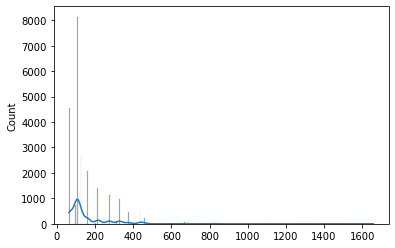

In [13]:
plotDists(m.predict(X_train))

In [14]:
r2(y_train, m.predict(X_train))

0.8539828500814645

In [15]:
d = DecisionTree(X_test_np, y_test_np, MAX_DEPTH, METRIC)
d.fit()
r2(y_test_np, d.predict(X_test_np))

C:\Users\ANHNVQ\AppData\Local\Temp\ipykernel_1572\989653657.py:21: RuntimeWarning: Mean of empty slice.
  return np.sum((y-y.mean())**2)/total
C:\Users\ANHNVQ\anaconda3\lib\site-packages\numpy\core\_methods.py:189: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
C:\Users\ANHNVQ\AppData\Local\Temp\ipykernel_1572\989653657.py:21: RuntimeWarning: invalid value encountered in double_scalars
  return np.sum((y-y.mean())**2)/total


0.8850291150316988

In [17]:
m = DecisionTreeRegressor(max_depth = MAX_DEPTH, criterion=METRIC)
m.fit(X_test, y_test)
r2(y_test, m.predict(X_test))

0.8850291150316988

<AxesSubplot:ylabel='Count'>

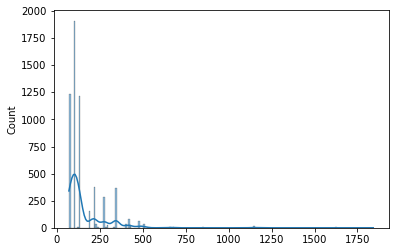

In [18]:
plotDists(m.predict(X_test))

In [11]:
d = DecisionTree(X_train_np, y_train_np, MAX_DEPTH, METRIC)
d.fit()
r2(y_train_np, d.predict(X_train_np))

C:\Users\ANHNVQ\AppData\Local\Temp\ipykernel_1572\989653657.py:21: RuntimeWarning: Mean of empty slice.
  return np.sum((y-y.mean())**2)/total
C:\Users\ANHNVQ\anaconda3\lib\site-packages\numpy\core\_methods.py:189: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
C:\Users\ANHNVQ\AppData\Local\Temp\ipykernel_1572\989653657.py:21: RuntimeWarning: invalid value encountered in double_scalars
  return np.sum((y-y.mean())**2)/total


0.8539828500814645

# K-Nearest Neighbors

## Xây dựng mô hình

In [60]:
X_knn = X.to_numpy()
y_knn = y.to_numpy()

In [61]:
# Splitting the dataset into test and train datasets
train_split_percent = 0.7
size = X.shape[0]
X_train_knn = X_knn[:int(train_split_percent * size),:]
X_test_knn = X_knn[int(train_split_percent * size):,:]
y_train_knn = y_knn[:int(train_split_percent * size)]
y_test_knn = y_knn[int(train_split_percent * size):]

In [62]:
#Standardizing 
mu = np.mean(X_train_knn, 0)
sigma = np.std(X_train_knn, 0)
X_train_knn = (X_train_knn - mu ) / sigma
X_test_knn = (X_test_knn - mu ) / sigma

#Standardizing 
mu_y = np.mean(y_train_knn, 0)
sigma_y = np.std(y_train_knn, 0, ddof = 0)

y_train_knn = (y_train_knn - mu_y ) / sigma_y

In [65]:
#Changing the shape 
y_train_knn = y_train_knn.reshape(len(y_train_knn),1)
y_test_knn = y_test_knn.reshape(len(y_test_knn),1)
y_pred_knn = np.zeros(y_test_knn.shape)
y_train_knn.shape, y_test_knn.shape,y_pred_knn.shape

((20672, 1), (8860, 1), (8860, 1))

In [66]:
n_neigh = 10
for row in range(len(X_test_knn)):
    euclidian_distance = np.sqrt(np.sum((X_train_knn - X_test_knn[row])**2, axis = 1 ))
    y_pred_knn[row] = y_train_knn[np.argsort(euclidian_distance, axis = 0)[:n_neigh]].mean()* sigma_y + mu_y
    
lr_r2_score = r2_score(y_test_knn, y_pred_knn)
lr_r2_score

0.7616549019868204

## So sánh với sklearn

In [67]:
from sklearn.neighbors import KNeighborsRegressor

In [70]:
neigh = KNeighborsRegressor(n_neighbors=5)
neigh.fit(X_train_knn, y_train_knn)

KNeighborsRegressor()

In [71]:
knn_predicts = neigh.predict(X_test_knn)
r2_score(y_test_knn, knn_predicts)

-161.4717878880886